In [ ]:
from IPython.display import Video, YouTubeVideo

# Introduction: Let's Look Behind the Curtain

Python is a wonderful language that lets you do a lot of cool things, especially in the GIS realm. When combined with libraries like Esri's ArcPy you can manage, analyze, and manipulate geospatial data to your heart's content.

## A performance-enhancing drug

I've created Python programs to tackle many tasks and problems. One of my favorites is a [program](https://github.com/jacobdadams/rcp) that uses the open-source GDAL libraries to create hillshades with actual shadows. These hillshades can be used to create stunning physical maps (after letting it run for hours on end):

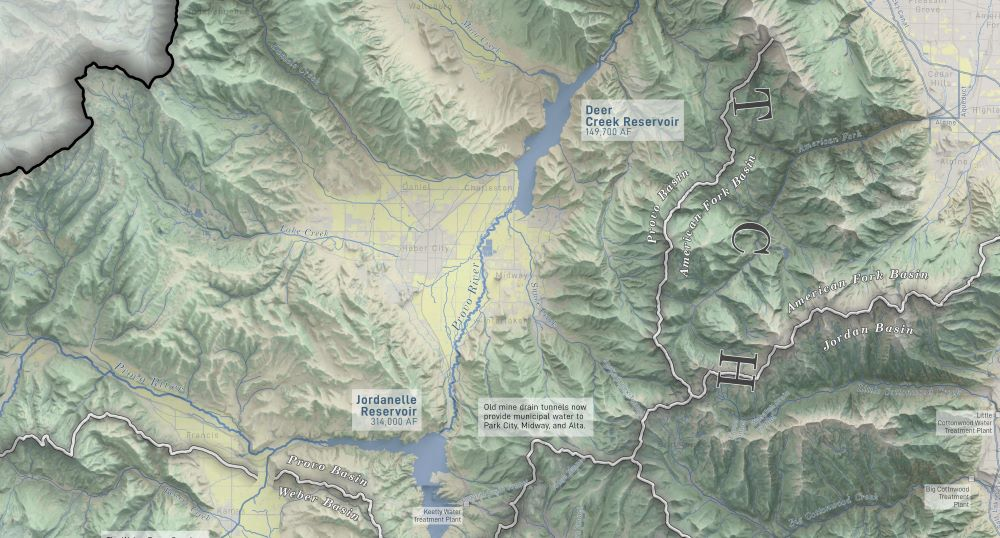

I also wrote another [program](https://github.com/agrc/historic-judicial-districts) that took a shapefile of historic county boundaries and a table of historic district court assignments and created a new shapefile where every unique combination of county boundaries and district court for every county from 1850 to the present has an accompanying geometry:

<video controls src='pics/counties.mp4' />

If data management is more your thing, our office has been developing and using [Forklift](https://github.com/agrc/forklift) for over 5 years to move data into an SDE (and lately also uploading to AGOL) on a nightly basis. 

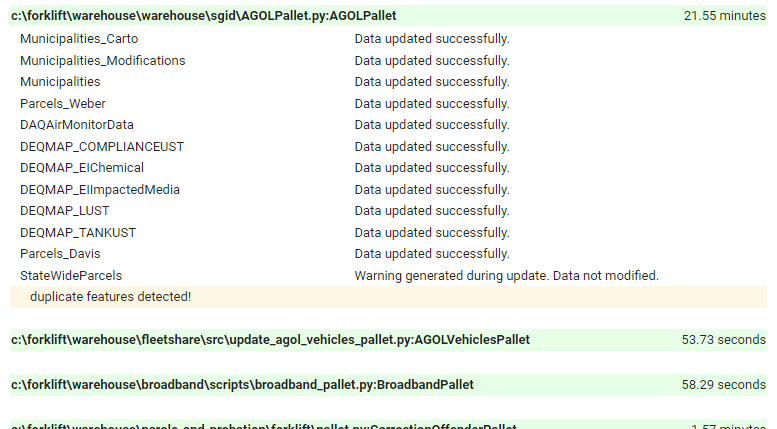

Each of these took days, weeks, or years of development to get where they are now. However, it all starts with learning the basics.

## Today's goal

Programming consists of three main skills:
1. Understanding the syntax of your language of choice
1. Breaking a problem down into individual, workable chunks
1. Finding a way to use the programming language to work on each of those chunks

These skills are not black and white, either you understand it or you don't types of things. Instead, **you'll grow in ability with practice and training**. They're also very inter-related: as you improve your understanding of the language, you'll see new ways to string the various parts of the solution together, which in turn will help you figure out new ways of breaking the problem down next time.

Starting out with a little bit of Googling and liberal use of the copy/paste shortcuts, you can put together a program that accomplishes simple tasks. After a while, you'll start to get a sense for how the languge works, but you'll soon discover that as your scripts get longer they get more complicated and difficult to update.

For this class, I want to do more than just teach you the syntax of Python. **I want to dig a little deeper and understand how different parts of Python work and why they can help you write better programs.** We'll show language features but we'll also dive into a little bit of theory. 

**Don't fret if you don't retain everything we talk about today.** Some things will be deeper than your average intro class. My main idea is to plan the seeds in your memory so that when you run into problems, you'll have enough to start searching and learning on your own.

### By the end of the day, our goal is to be able to write a modular, easy to maintain program that can crawl through a folder full of geodatabases and reproject all the feature classes, saving them into a single output GDB.

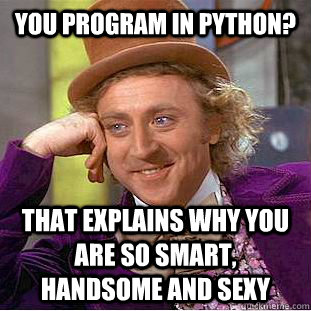

## The Programmer's Mindset

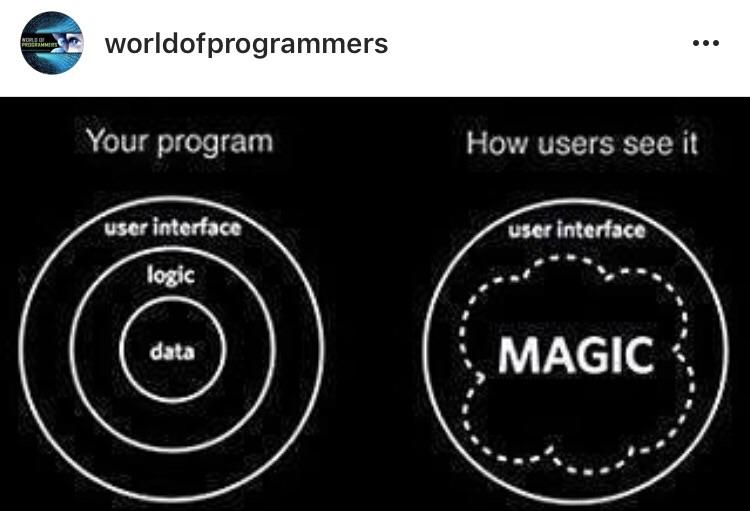

Contrary to popular opinion, programming is NOT magic. Perhaps the most important thing to remember is that **everything happens for a reason.** If something unexpected happens, it's because something that you programmed or that someone else programmed in code you're referencing. 

Programming is about **decomposition** (and no, not the rotting apple kind). It's about taking a problem and breaking it down into smaller and smaller steps until the steps line up with Python syntax. As you write more code, some common steps will begin to become second nature, allowing you to solve more and more complex problems.

Early on when you don't understand everything that's going on, it's easy to think it's magic. Take a breath and remember that with enough time you can understand it all. **Your task is to figure out if you really need to know why and then start learning about that one thing.**

## Learning Resources

There are lots of good resources for learning how to program in general and Python in specific:

* [docs.python.org](https://docs.python.org/3.7) — Start with the Tutorial, go back to the Library Reference for info about classes and methods, and check out the Language Reference if you want to get really nuts & bolts.
* YouTube — Look around until you find a presenter you can follow along and dig in.
* MIT Open CourseWare — Check out [this course](https://ocw.mit.edu/courses/electrical-engineering-and-computer-science/6-0001-introduction-to-computer-science-and-programming-in-python-fall-2016/). There are many others on specific computer science topics.
* Esri Training — Search for Python in their [training catalog](https://www.esri.com/training/catalog/search/) 
* Other free online courses
* Other websites — I find msyelf frequently referencing [RealPython](https://realpython.com/) and [GeeksForGeeks](https://www.geeksforgeeks.org/python-programming-language/).
* Pluralsight — Especially the [Core Python series](https://www.pluralsight.com/courses/getting-started-python-core) by Austin Bingham and Rober Smallshire.
* Books — [Python Craftsman trilogy](https://leanpub.com/b/python-craftsman) by Bingham and Smallshire, [The Pragmatic Programmer](https://www.barnesandnoble.com/w/the-pragmatic-programmer-david-thomas/1132520344?ean=9780135957059) by Thomas and Hunt

## Be a Mad Scientist. Experiment!

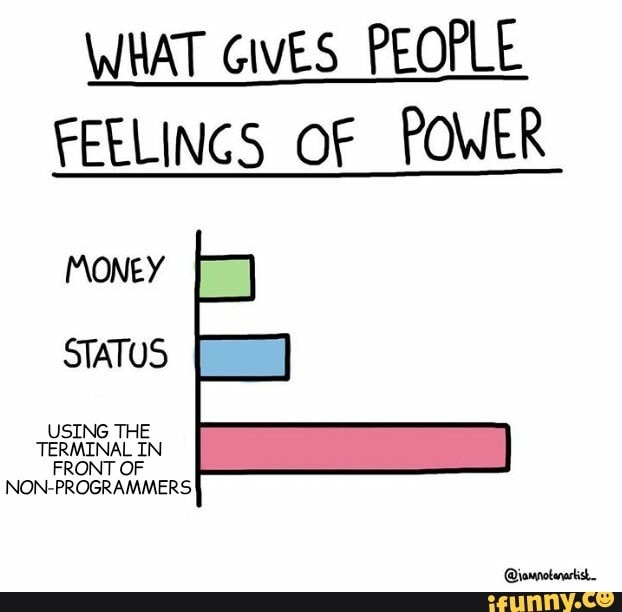

One of Python's strengths is that you can **run python expressions interactively in the console** (often called the REPL: Read, Evaluate, Print Loop). This gives you the opportunity to experiment with syntax and concepts without having to open a new file or litter your working code with comments and prototypes. 

When you're reading or watching something to learn about python, pop open the console and try it out for yourself. Today I encourage you to **follow along with the examples as I type them**. This will get you used to the patterns and syntax and hopefully help get it engrained in your mind.

**As you program in the future, keep a console open as well to try stuff out.** I've almost always got an iPython window open to test ideas or verify that I remember how a certain method or expression works.

Play. Experiment. Form ideas of how things work, then try them out to see if you've figured it out right.

# Getting Set Up: Conda (Because everything in python references snakes or Monty Python)

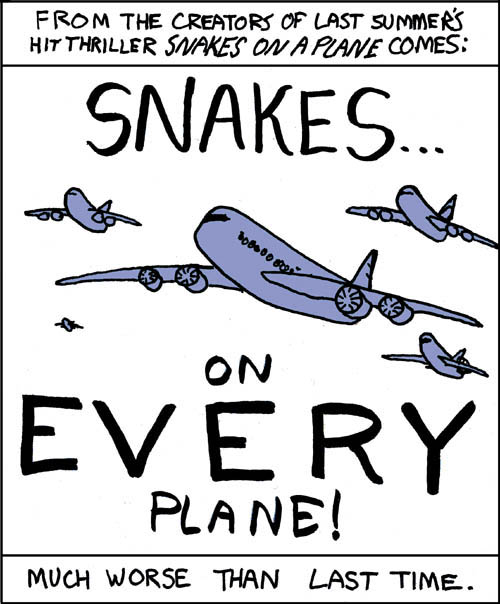

Before we get too far along, lets get our Python environment set up so that you can follow along with the examples. 

## Virtual environments, `pip`, and conda

Setting up Python has gotten much easier thanks to ArcGIS Pro bundling and using Conda.

**Virtual environments**, as provided by Python's `venv` command, allow you to create sandboxed installations of Python where you can install packages and programs to your heart's content without worrying about interfering with other versions installed for different projects. 

You know you're in a virtual environment when you see the environment name in front of your prompt on the command line: 

`(ugic) c:\gis>`

You can switch your environment by typing `activate environment_name`.

**Package management** allows you to install code other people have written so you can use it in your code, or to install tools and utilities to make development easier. It handles _dependencies_, any other packages that your desired package needs to run.

The normal Python package manager is `pip`, and you'll install software by first activating your environment and then typing `pip install package_name`. `pip` downloads the package and performs any necessary setup steps (some packages include code that needs to be compiled, for example). `pip` searches for programs on [pypi](https://pypi.org), the PYthon Package Index.

**Conda** combines both virtual environment management and package management into one one product. 

You can create new environments with `conda create -n environment_name`, or you can clone from an existing one (like the default ArcGIS Pro environment) with `conda create -n environment_name --clone environment_to_clone`. You switch environments just like before: `activate environment_name`.

Conda also includes its own package management system. It can install packages for many other languages, but we'll focus on Python. Unlike `pip`, conda packages are always pre-compiled and ready to go. It just downloads them and puts them in the right place. You can have conflicts if both `pip` and conda install the same package, so stick with conda unless the needed packages are only available in `pip`.

You install packages with `conda install package_name`. You can also specify the _channel_, or repository, to use. For example, you can install arcpy from the Esri channel with `conda install arcpy -c esri`.

## Setting up a `ugic` environment

For now, let's just **clone the default ArcGIS Pro environment** so that we know we've got everything we need for today.

First, open the "Python Command Prompt" installed in your ArcGIS start menu folder. This starts a command line with all the proper environment variables set.

Next, clone the default ArcGIS Pro environment:

`conda create -n ugic --clone arcgispro-py3`

This may take a while, so let it do its thing while we move on. When it finishes, type `activate ugic` to start working in our new environment.

# Theory: Some Quick Computer Science Fundamentals

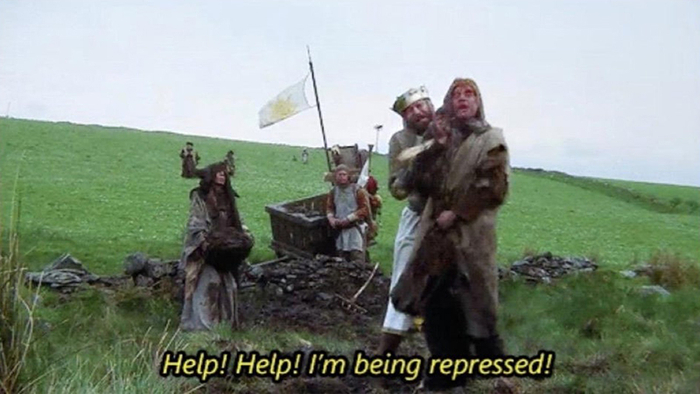

Before we dive into Python we need to get a quick understanding of some CS fundamentals and terminology that will help us understand concepts later on.

## Programs: From binary to Python

Put simply, a program is a collection of instructions to be executed by the computer's processor. However, how do we get from vaguely-English words in a text file to `0`s and `1`s the CPU can actually handle?

Computers are all about **levels of abstraction**. Once someone has figured out how to do something complex, they package it up and make it available to everyone else. 

It starts at the bottom with **binary CPU instructions**. The logical structure of the CPU can recoginize different patterns of bits and knows what to do with them. 

But programming in binary is tedious, so they invented **assembly language**. This is just a simple 1:1 mapping of binary instructions to something vaguely resembling English text. An assembler program translates this to binary data the CPU can understand.

While better than binary, assembler is not easy to understand. You only have a few data you can store data you're working on (registers) and they have weird names (`eax`). So they invented **compiled languages** (like C). These let you use whatever variable names you want and provide syntax for common operations, like looping and comparing data. You can create your own custom data structure to hold large or complicated datasets. A comiler takes these text files and converts them to assembly, which is then assembled to binary.

Compiling a program can be complicated and time-consuming, especially as the program gets larger and uses more libraries. One solution to this is **interpreted languages**, where an interpreter (which for Python is written in C) evalutes the language's expressions and maps them to pre-compiled bits of code which are then run. An interpreted language trades execution speed for ease of use.

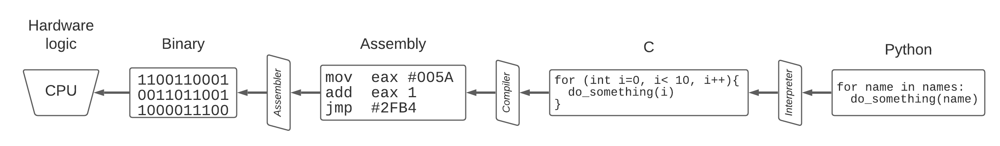

## Variables and Memory

Computer memory is a collection of storage areas that are all the same size and have their own unique addresses. Programming languages alllow us to **give these addresses a human-readable name — a variable name**. Python does all the dirty work of managing memory and making sure the space for unused variables gets released ("garbage collection") for you. However, there are a few circumstances where it's useful to understand the distinction between storing raw values at a memory address and storing a reference to another address.

In a language like C, when you declare a variable like `int c = 5`, the compiler picks a memory location, **stores the raw value `5` in that location**, and notes that the variable `c` corresponds with that location. 

If you want to store more complex data (like a list) that won't fit in a single address, the compiler reserves enough space elsewhere in memory and then stores the address to the beginning of this reserved space in the memory location associated with the variable. Instead of storing the raw value, we say that **the variable now _references_ the more complex data elsewhere in memory**.

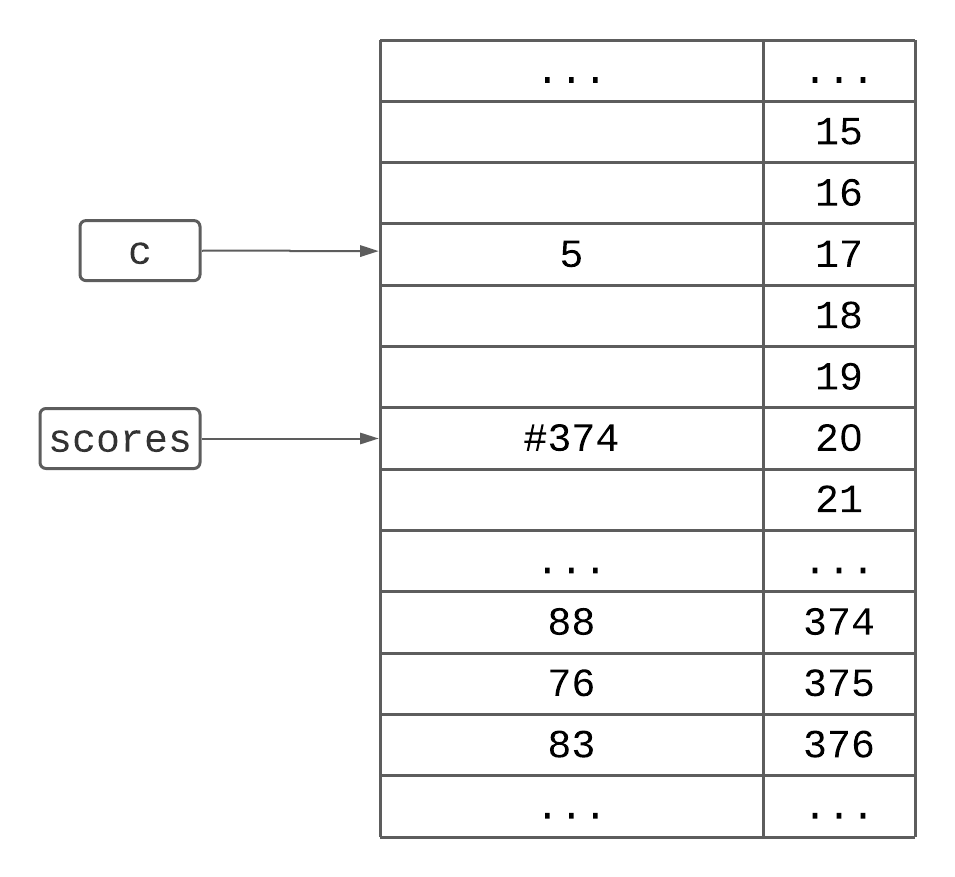

As we'll see later, in Python everything is an object, which means all variables in python are actually references. The important thing to remember is that a variable name doesn't necessarily refer to a pure value but may reference something else that refers to the value.

## 	¡All the terminology!

* **Variable**: A named reference to a location in memory.
* **Function**: A named code block that can be called (or run) in other places in your code. Used for organizing your code and making it more reusable.
* **Class**: A named code block for logically grouping data (attributes) and operations (methods). When invoked it creates an Object; you can think of it as the blueprints for creating objects.
* **Object**: A concrete, in-memory instance of a class. You can create any number of objects based on a single class. For example, from a `Person` class you could create three objects referred to by the variables `jake`, `zach`, and `steve`, each with the same attributes but different values for those attributes.
* **Attribute**: A variable that belongs to a class/object, accessed by `object_name.attribute_name`. The `Person` class could have a `last_name` attribute, and `jake.last_name` could be `Adams`.
* **Method**: A function that belongs to a class/object, accessed by `object_name.method_name()`. Methods are the way you access or update an object's attributes. For example, `jake.happy_birthday()` could increase `jake.age` by 1.
* **Namespace**: The collection of variables and functions that have been defined in certain levels of a program, maintained as a series of dictionaries. 
  * **Local** namespace: The variables and functions defined within a function
  * **Enclosing** namespace: The variables and functions defined within any functions that enclose the current function
  * **Global** namespace: The variables and functions defined within a module (ie, "script" scope)
  * **Built-in** namespace: The variables and functions built into Python, like `str()` and `open()`
* **Mutability**: Whether an object can be modified. _Mutable_ objects can have their attributes changed. _Immutable_ objects cannot change their attributes; often changing the value of an immutable object often involves creating a new object with the different value.

# Getting Started with the REPL

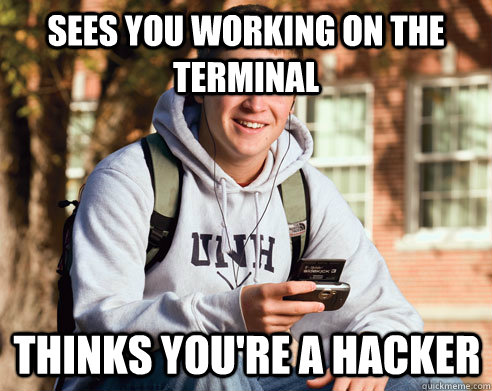

As mentioned, Python provides a Read, Evaluate, Print Loop (REPL) environment where you can type out Python expressions (single lines of code or multi-line code blocks), run them, and see the results printed out. It then loops back for you to type the next expression.

## `python`

Our new `ugic` environment should be baked by now. Make sure to activate it with `activate ugic`.

Now, to enter the basic Python REPL, type `python`. You should see some info about the installed version of Python and three arrows: 

`>>>`

This is the REPL prompt. Later, when we deal with indented blocks of code, it will change to `...` once we're in the block.

A common example is **using the REPL as a calculator**. Try this:

In [ ]:
3 * 3

In [ ]:
42 / 7

Each of these is an **expression: some bit(s) of data and an operation on that data**. We can store an expression's result as a variable and then print it out:

In [ ]:
the_answer = 6 * 7

In [ ]:
print(the_answer)

To exit, type `exit()`

## `ipython` 

The basic REPL works ok. However, **`ipython` was created to provide a more interactive experience**. `ipython` gives you some basic syntax coloring, interactive help, and a history function. 

The history funcationality is particularly useful. Even after closing and reopening ipython (you can just do `exit` now!), you can use the up and down arrows to see commands from past sessions. You still have to run them, though—the values of the variables aren't saved, just the expression text itself.

If you want to search the history, you can use `ctrl-r` and then start typing any part of the expression. Once you find the one you want, hit `Enter` to choose it, and then `Enter` again to run it.

## Jupyter notebooks: `ipython` on steroids 

The `ipython` team took their work one step further and created Jupyter Notebooks (which is what this presentation is created with).

**A Jupyter notebook is a single file that allows you to mix ipython-like interactive code blocks with markdown text.** You can evaluate each block in whatever order you want. This is useful for prototyping, but can mix you up because now code is "lower" in the file isn't gauranteed to have run after the code above it.

Jupyter notebooks rely on a back-end server for all the processing. This opens a window in your browser that points to your own computer (`localhost`). You can now create as many notebooks as you'd like, which are saved as `.ipynb` files. 

When you launch the server, it starts you out in a base directory. Running "Jupyter Notebook" from the ArcGIS Start Menu folder uses your user folder (`C:\users\user_name`) as its base. When you start it from the command line by typing `jupyter notebook`, it will use the terminal's current directory as the base.  

### Dive in

Go ahead and start the server in your preferred base directory. Create a new notebook to follow along today.

A "cell" can have two main types: code or Markdown. 
    
A **code cell** has `In [ ]:` next to it. Hitting `shift-enter` will run the contents of that cell with python.

A **markdown cell** doesn't have anything next to it. Any text typed in this cell will be formatted with [Markdown](https://www.datacamp.com/community/tutorials/markdown-in-jupyter-notebook), the same text formatting used in GitHub, Slack, and several other programs. Hitting `shift-enter` will format the text for that cell.

A cell with a green border is in edit mode, while a cell with a blue border is in command mode. While in command mode, you can use a host of [keyboard shortcuts](https://www.dataquest.io/blog/jupyter-notebook-tips-tricks-shortcuts/). You can use `esc` to go from edit to command mode, and `enter` to go from command to edit. In command, I freqently use `a` and `b` to add new cells above or below the current one and `m` and `y` to change the cell type to markdown or code. You can also click inside a cell's input area to enter edit mode or outside the edit area to go to command mode.

# Simple Variables

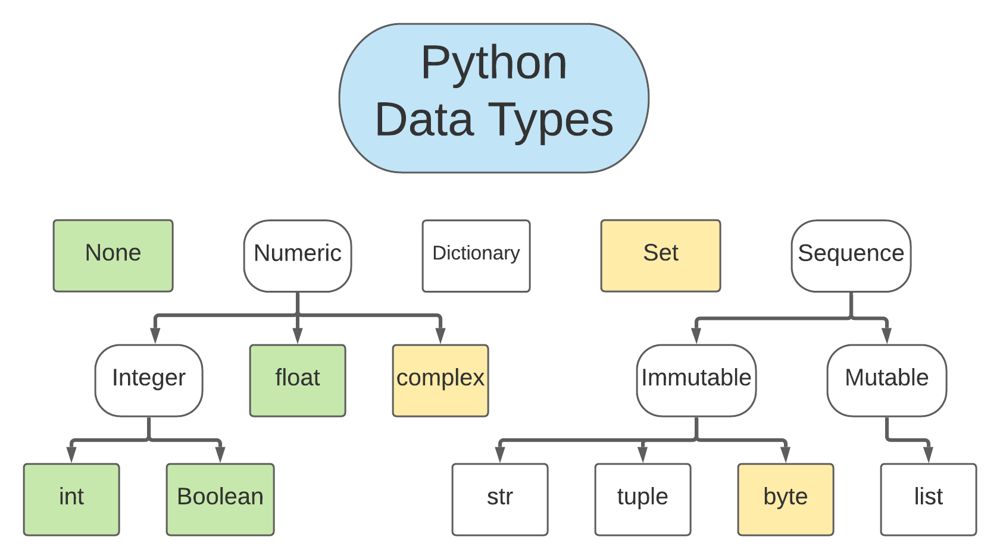

## None

A special object representing Null, nothing, zip, zilch, nada

## int 

Whole numbers of any positive or negative value (no longs, shorts, etc)

## float

Double-precision floating-point numbers. Range depends on platform and desired precision.

Any operations with both ints and floats automatically promote the into to a float

We'll come back to floats in a minute...

You can increment an int or float, or add another number to it and save it to the same name, using `+=`, etc.

## bool 

True or False

Note the colors. Capitilization matters here

## Floats and Precision

Tom Scott explains it in a British accent:

In [ ]:
YouTubeVideo("PZRI1IfStY0")

# Sequences and Collections

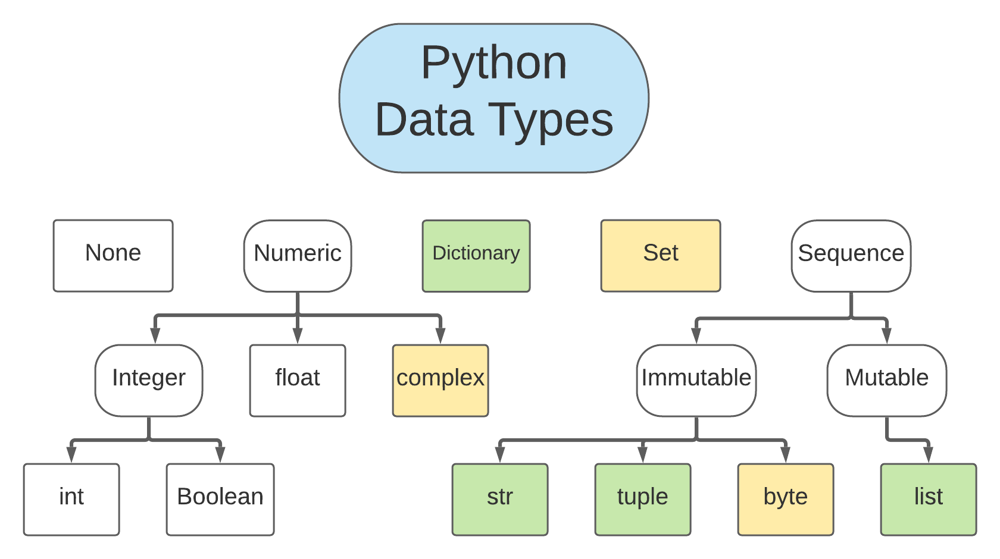

Under the hood, there are a handful of common operations that make an object a "sequence":
* If you can pass it to `len()` and get a value
* If you can access specific elements by index - `names[3]`
* If you can access a subset of elements via slicing - `names[1:5]`
* If you can iterate over each element using the `iterator` interface 

Now's also a good time to talk about `mutability`. 

An object is mutable if it's value can change. So far, everything we've looked at are immutable. When we change the value of an int variable, we're actually pointing to a new object. **Some collections are also immutable, while others' mutability are part of their inherent usefulness.**

## Strings
A sequence of unicode characters that make up text.

More about strings to come later

## Lists
A mutable collection of any other objects. A very common and valuable tool.

Like strings, we'll return to lists later

## Dictionaries
A mutable collection of key:value pairs. Keys must be unique within the dictionary and immutable, but values can be anything

## Tuples
An immutable collection- a list you can't change

One place where you'll use tuples a lot is tuple unpacking. Some functions return multiple objects as a tuple; it helps to unpack them into their own variables.

## Others

There are some other sequences.
* **Bytes**: Raw binary data, often used for HTTP responses or reading binary files directly
* **Sets**: Collections that expose set theory/algebra for evaluation and modification

# Iteration, or the Definition of Insanity

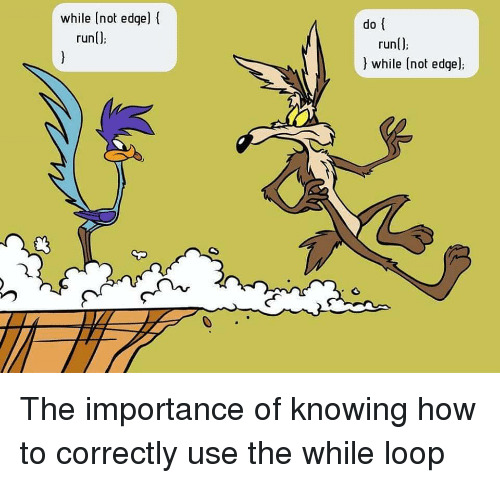

Loops are the main construct for doing something multiple times. You set up some initial conditions and then repeat the body of the loop until those conditions are met.

**Python has two main loops: `for` and `while`**. 

## for loops

Python's for loops can be more accurately thought of as "for-each" loops. They **iterate through some sort of collection and terminate after the last item**. You define a variable that will refer to each element in turn within the body of the loop.

Sometimes you'll want a counter variable (like other languages' `i`) so that you can access other elements in the collection relative to the current item. You can **use the `enumerate()` built-in function and tuple unpacking to create a for loop that returns both a counter and the respective element**. Be aware, though, that you'll have to do your own bounds checking to make sure you don't try to access an element that doesn't exists!

While you can emulate a "traditional" for loop using len() and range(), it's considered unpythonic and you have to handle bounds checking on your own.

## Breaking out of loops: break, continue, return

Sometimes you want to interupt a loop before its natural end. There are three statements that you can use:
* `continue`: don't process any more of the current iteration but move on to the next ("this door's locked, move on to the next one").
* `break`: stop processing this iteration and any that come after it; move to the code after the loop.
* `return`: if you're in a function, you can return early and avoid nested if statements (more on those later)

## while loops

Python's while loop allows you to **do something over and over until a certain condition is met**. This can be useful for polling user input or retrying an operation until it succeeds.

You can put your condition comparison as part of the `while` statement, or just do `while True` and then use `break` to bail out when your condition is met. 

## Iterating over Dicts

Iterating over a dictionary is slightly different than lists or tuples. You'll need to call the `.items()` method on the dict, which returns a tuple for each key and it's value in the dict. You can then use tuple unpacking to access them by their own variable in a for loop:

## Comprehensions: skip the for loops

Performing the same operation on every element of a list or dictionary to generate a new list/dict is a very common task. Python provides a shorthand way of performing this called **comprehensions**.

List comprehensions follow the format `[`**`expression`** `for` **`variable_name`** `in` **`sequence`** `if` **`condition`**]`:
* `expression`: any expression that operates on `variable_name`.
* `variable_name`: a reference to the individual items in the `sequence`, just like in a normal `for` loop.
* `sequence`: any iterable object (list, dict, tuple, string, etc).
* `condition`: optional boolean expression (more on conditionals later) to only operate on certain elements.

One way to **create a _shallow copy_ of a list is the comprehension `[x for x in original_list]`**. No operation is performed on the items, they're simply saved to a new list. If performance matters, slicing does it faster (more on slicing later).

Dictionary comprehensions are similar to list comprehensions, but they require a `expression: expression` format, just like a normal dictionary, to specify the key: value pairs. These are uncommom, but you could use one to alter the text of an existing dictionary.

# Exercise: Iteration

## 1. Addition

Write the code to add all the numbers in the list `[1, 2, 3, 4, 5, 6, 7]` together and print out the result

## 2. Dictionaries

Create a dictionary of your favorite travel locations, where the keys are states or countries and the values are a list of cities or destinations in that state/country. Then, loop over your dictionary, printing the state/country and then, indented by a few spaces, each place so you get something like this:
```
Oregon:
    Crater Lake
    Powell's Books
    The Gorge
California:
    San Diego
```

For the indentation, you can use an f-string like this: `f'    {place}'`

## 3. Comprehensions

USGS topos use contours at a 40-foot interval with index contours every 200 feet. 

Use a comprehension to create a list of the index contours in the elvations `[3200, 3240, 3280, 3320, 3360, 3400, 3440]`.

You can figure out if a number is an index contour using the modulus operator `%`, which returns the remainder after dividing the first number by the second number. Thus, if `x % 200` equals (`==`) 0, `x` is divisible by 200 and is thus an index contour.

# Theory: Everything in Python is an Object

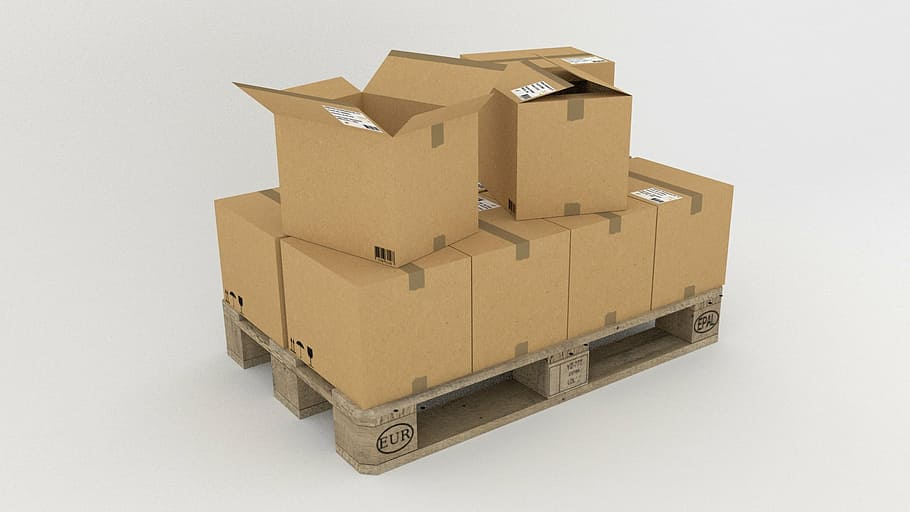

As a reminder, **an object is a collection of variables and methods all bound in a common namespace**. An object has an **identity**, **type**, and **value**.  

Everything in Python is an object, even simple variables like ints and floats. This introduces some performance overhead, but also lets us do some nifty tricks. 

Because everything is an object, there are going to be methods and special variables available to the programmer. Some of these are defined using leading and trailing double underscores: `__doc__`. **We call these "dunders", like "dunder doc."** We can see all the different attributes for an object using the `dir()` function.

When we type the variable name then dot, `numbers.`, and hit tab, the interpreter uses introspection to list the avaiable normal attributes- in this case, `count` and `index`.

In [ ]:
#numbers.

We've already used another function, `type()` to show the objects type. If you need to check the type of an object in a program, though, it's better to use `isinstance()`

## Identity vs Equality

The first consequence of everything being an object that you'll probably encouter is **the difference between two objects having the same identity vs the same value.** We can use the `id()` function to get the memory address of an object. If two variables have the same address, they're the same object.

**We can check equality, or check if two items have the same value, using `==`**. You'll use this a lot in conditionals (more on that later). This expression returns either the Boolean variables `True` or `False`.

But, what happens if we try to duplicate a variable by assigning a new variable to our exsting variable?

"Copying" a variable in this way doesn't actually copy the object's _value_, but rather it's _identity_. `last2` is just another name pointing to the same memory location as `last`. We can check this explicitly using the `is` operator

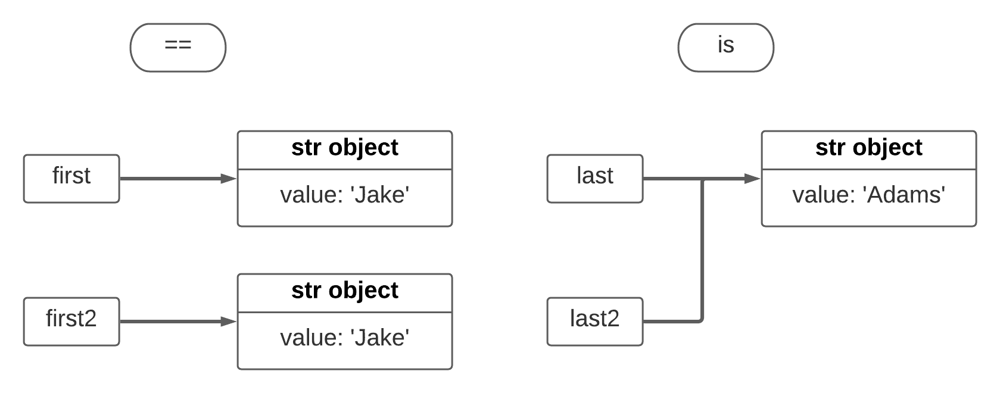

So, we have two separate operators to compare variables (objects):
* `==`: compares _value_
* `is`: compares _identity_

Almost all the time, you'll use `==` to compare objects. The common exception is when you explicitly want to **check if something is `None`**

## More on copying variables, and why lists can give you headaches

So we showed how you can "copy" a variable by assigning another name to an existing variable name. What happens if we change the value of one of them later?

So wait, if they point to the same object, why doesn't updating one update the other? 

Because, strings are _immutable_. When we change the value of a string variable, we're actually creating a new string object and reassigning the name to the new object. The same thing happens with ints, floats, tuples, and any other immutable objects.

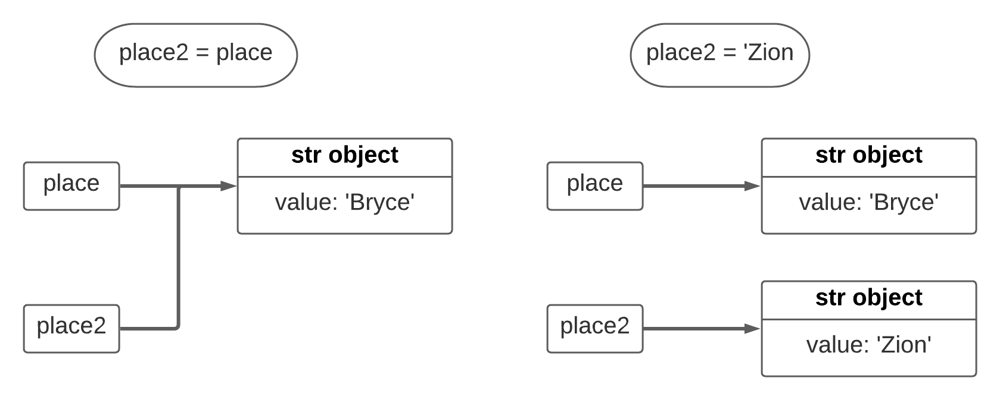

Where this will bite us is for lists, dicts, and any other mutable object. This includes the vast majority of the "non-basic" objects you'll encounter, like objects from arcpy or the ArcGIS API for Python. If you update the object (rather than replace it with a different object), the first one will get updated too.

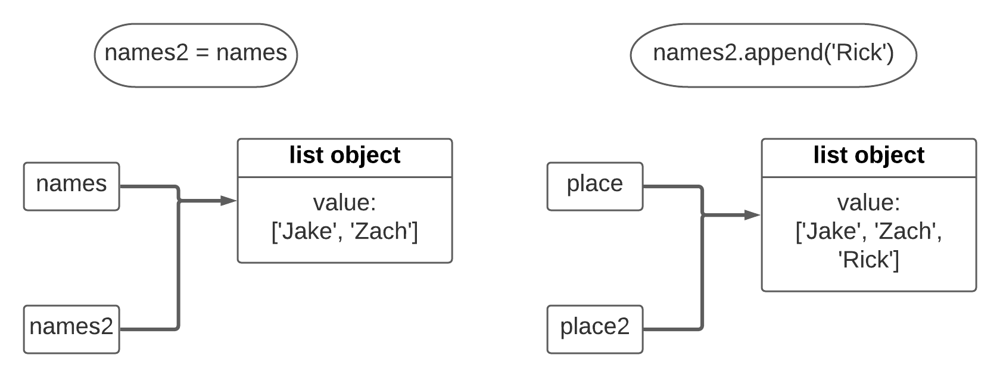

A final peculiarity is that python always passes objects to functions by reference, never by copying the object's value. We'll look at this when we explore functions later. 

# More on Strings

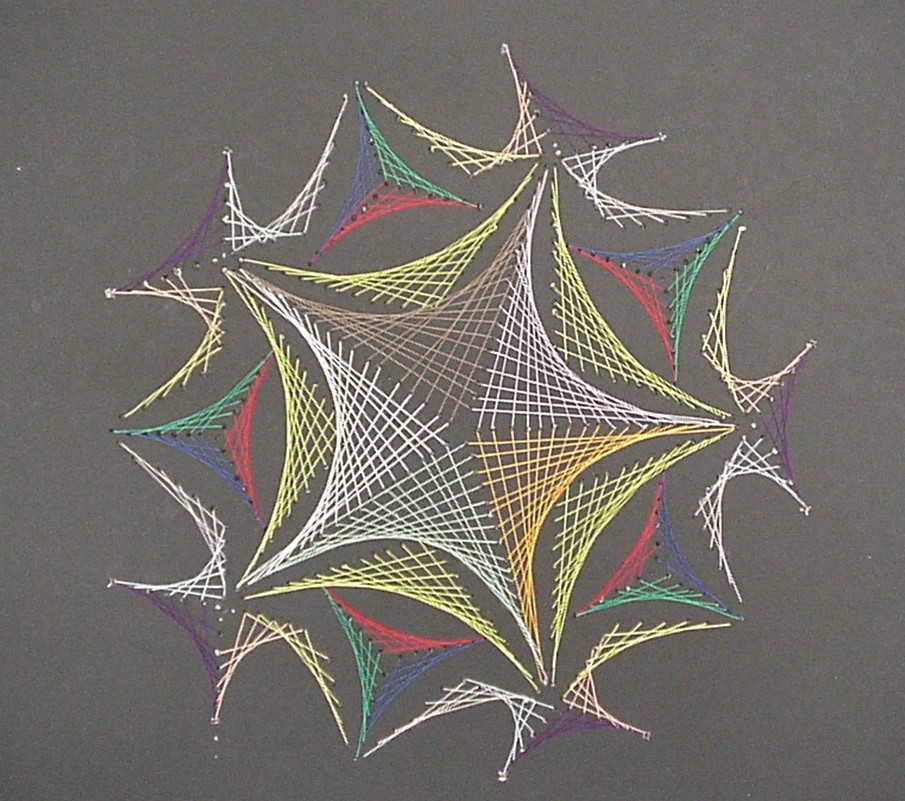

As promised, let's take a look at some of the things you can do with strings. These are some of the most common objects you'll be working with, so it will help to be familiar with everything.

## String Methods

Chances are you're going to be operating on strings a lot. Whether it's splitting alphanumeric parcel ids, or parsing out a section number, or trying to sort out addresses, it all starts with strings.

String objects have [a lot](https://docs.python.org/3.7/library/stdtypes.html#string-methods) of methods available. We'll touch on a few here. 

It's important to remember that strings are immutable. None of these methods change the value of the variable they're called on; they return a new string that you must assign to a variable You can overwrite the existing variable if desired.

## Come together, right now, over me

There are several different ways to join strings. The most common is just the `+` operator. If you have a list of strings, **you can call `' '.join(list_of_strings)` to join them all using a blank space between them**. Note that we're calling it on the character we want to have between the strings, not the list of strings themselves. Python will also implicitly concatenate any strings together that are defined one after the other, but for clarity's sake it's best to use `+` or `.join`.

## Formatting Strings

You'll also find yourself wanting to insert other variables into the middle of strings, or build strings from multiple variables. Python's **format strings, or "f-strings", make this really easy and readable**. Start the string with `f'` and then wrap any variable names in `{}`. 

This is especially handy when you want to build the same string for multiple different values, kind of like a code version of the field calculator.

You can also specify how numbers in f-strings should be formatted. [This pdf](http://cis.bentley.edu/sandbox/wp-content/uploads/Documentation-on-f-strings.pdf) has a good overview on the options available.

## Raw strings: Preserving special characters (and your sanity)

**Within strings, some characters have special meanings**. We've already seen how to escape an unwanted closing quote mark with `\`. This is also used for some special print control characters, like `\t` for tab and `\n` for newlines. 

But what do we do for strings that should contain `\`, like paths in Windows? 

We could escape the escape character with another `\`, but that gets unwieldly quick, especially if you're accessing a network share.

Instead, we can use raw strings, which like f-strings **start with `r'` and will automatically ignore any special characters like `\`.**

# And More About Lists and Dicts

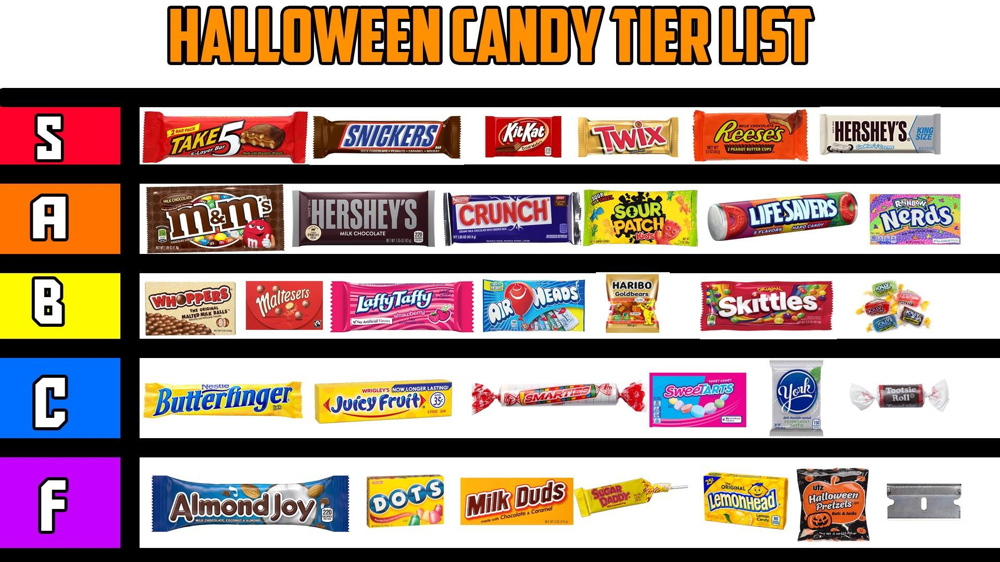

(Technically a dict of lists...)

## Lists and Tuples: Indexing, slicing, and dicing.

As mentioned, one of the things that makes lists and tuples sequences is that they can be indexed and sliced. 

**Indexing allows you to use `[]` to refer to the position** of the element in the list or tuple you want to access. The tricky thing is that indexes begin at 0, not 1. 

You can also use **negative numbers to index from the end of the list**. This is handy for getting the last element (or two or three) from a list.

Remember, there are only three difficult problems when programming: choosing variables and off-by-one errors.

Slicing is similar to indexing but allows you to specify a range of elements: `list[first:last]`. It returns the **first element mentioned and everything up to, but not including, the last**. In math notation, it's `[first, last)`. If you don't specify first or last, it goes from the start or to the end (respectively)

While this will probably trip you a couple of times, this example shows how this can be useful. Given index x, `[:x]` and `[x:]` allow you to cleanly split the list at index `x` without having to do any math.

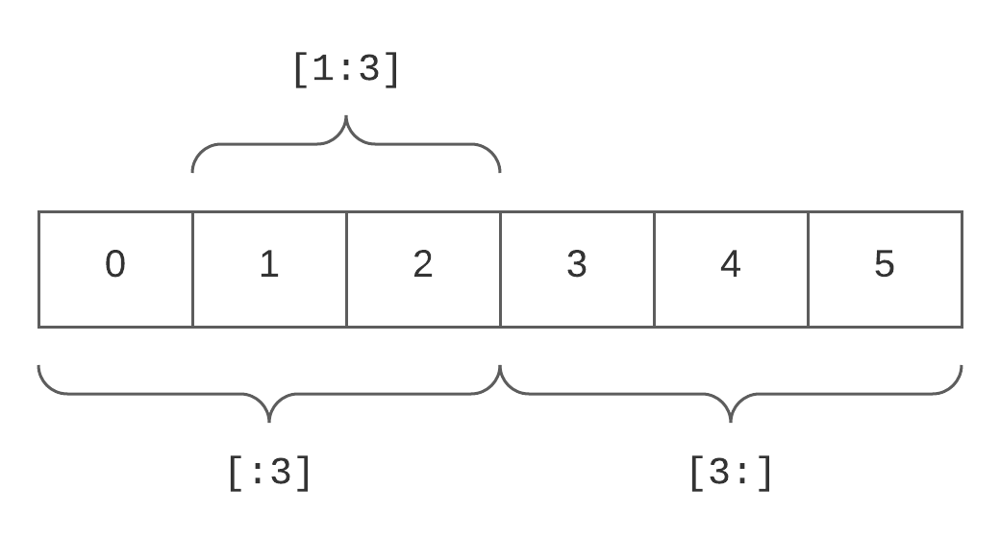

So, if you can omit either the starting or ending slice index, **what happens when you leave out both?** You get the whole list or tuple. Importantly and interestingly, slicing returns a _shallow copy_ of the list: it creates a new list object and copies the references to the objects in the original list into this new list object.

The reason this is a _shallow copy_ is that **it doesn't copy the list contents' values, just the references.** This is fine for immutable objects like ints and strings. However, if we have mutable objects—like a list of dictionaries, a common data structure—any changes to the inner objects will be seen in both lists. This is because they both still point to the same inner objects.

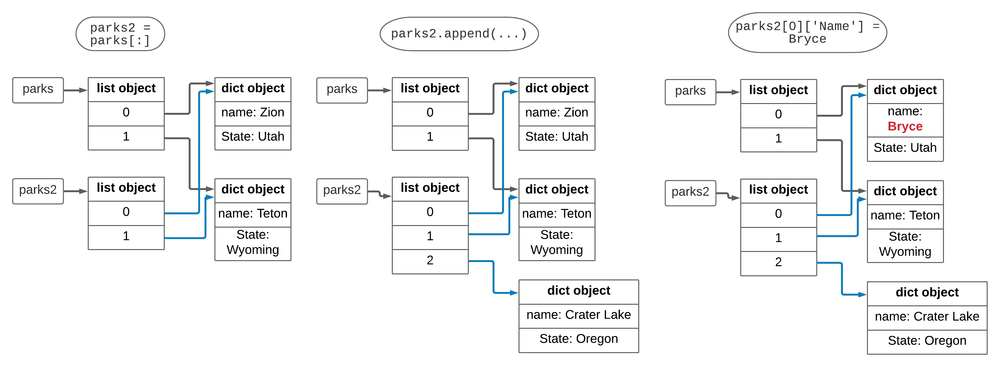

## Adding data to lists: append vs extend

One of the intrinsic values of lists is that **we can add and remove elements at will.** If we know the index of the desired object, we can use `.pop(index)` to remove it from the list. 

In my epxerience, it's much more common to add items to a list. We've used the `.append()` method a few times already. It just adds the method argument to the end of the list. 

What if we want to join two lists together?

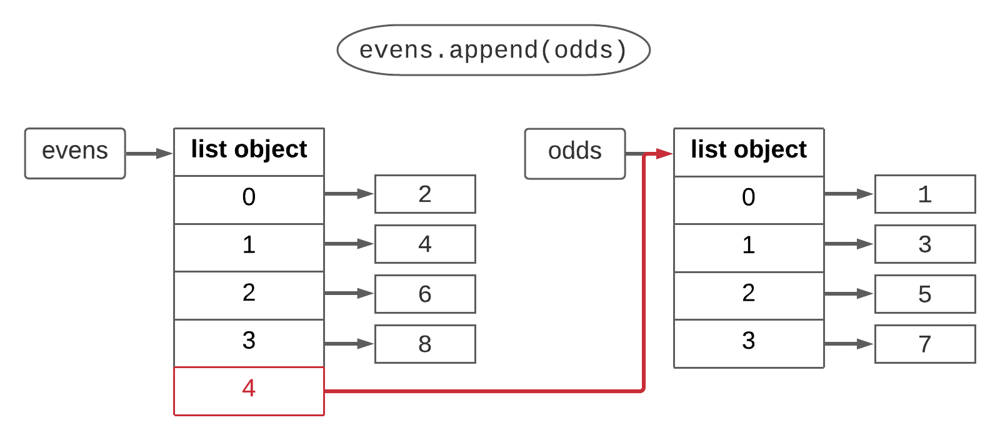

`.append()` just added the entire odds list object to the evens list. What we want is **`.extend()`, which will add the _elements_ of the argument** (which must be some sort of iterable) to the list.

## Adding data to dicts: update

As we showed earlier, you can add new keys to a dictionary just by using the new key in the bracket notation.

But what if we want to merge two dictionaries? We use the `.update()` method on the target dictionary. This will add all the keys in our other dictionary to the target, and will also overwrite any matching existing keys.

## .sort() and .reverse() vs sorted()

lists have `.sort()` and `.reverse()` **methods that operate in-place**- they modify the contents of the original list object. Python also has a built in `sorted()` function (with an optional `reverse` argument). The important distinction is that the list's methods modify the original object, while the built-in `sorted()` returns a new list.

# Comparisons and Conditions

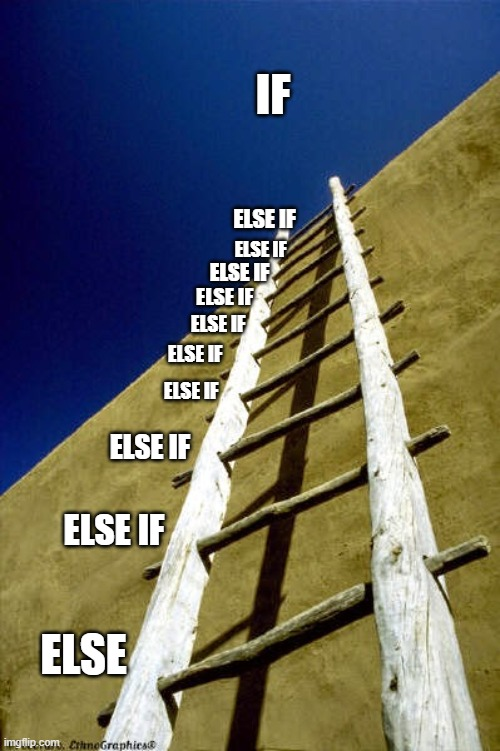

Another common operation is comparing two values and performing operations based on the result of this comparison. **Python provides the standard comparison operators: ==, !=, <, >, <=, >=**. 

Under the hood, Python uses the `__equ__`, `__gt__`, `__lt__`, `__ge__`, and `__le__` methods defined on the objects to determine how to make these comparisions. So, if you ever write your own classes, you can add equality checks of your own.

You can add the `not` keyword to **negate any boolean value**, or any statement that evalutes to a boolean value. 

You can use the logical operators `and` and `or` to **create complex comparisons**. `and` returns `True` only if both expressions are `True`. `or` returns `True` if at least one is `True`.

## Quack quack

As an aside, we rarely check the types of variables in Python. Later on we'll cover the idea of just asking forgiveness instead of permission. Python relies on the idea of **duck typing**:

> If it looks like a duck and quacks like a duck and flies like a duck, it must be a duck.

Rather than explicitely checking if a variable is a certain type, we **just try whatever it is we want to do with it and catch any errors that occur** (more on errors later). Pragmatically, as long as two variables divide, do we care if they're ints or floats? This helps avoid complicated if/elif blocks and other programming practices that kill readability. 

In more complex programs with user-defined classes, **duck-typing allows us to add new classes that are similar to existing classes without changing the code that uses the classes as long as they both do the same thing**. For example, let's say we wrote a class to represent a `.img` raster file, and it has a `read_file()` method specific to reading `.img` files. We could then create another class to represent `.tif` files with its own specific `read_file()` method. The code that uses these classes doesn't need to care which type of raster file object it gets, they both have `read_file()`. We say **they both have the same interface.**

## Members only: Testing membership with `in` 

You can use the membership operator `in` to **test if a value is in a sequence/collection.** For strings, lists, and tuples, it will return `True` if the value is found. For dictionaries, it checks the keys by default but you can check the values with the `.values()` method.

You can add `not` before it to check if it does not occur in the sequence.

Under the hood, `in` checks for a `__contains__()` method and then iterates through the items if its not present.

## It depends... if/elif/else

Python uses the `if`, `elif`, and `else` statements to perform **logical branching**. You'll always start with `if`, but you don't have to have an `else` clause if you don't logically need it. `elif` is a shorthand way of chaining `if`/`else` blocks together (similar to a switch in other languages).

We can cheat a little here and collapse these "variable between two values" into a shorter expresssion.

## Truthiness

Python supports the idea of "Truthiness" for a lot of objects to make comparison statements shorter and less verbose. **An object is considered "truthy" if it evaluates to `True`, and "falsy" if it evalutes to `False`.**  Under the hood, python does [three steps](https://docs.python.org/3/reference/datamodel.html#object.__bool__) to determine how an object evalutes:
1. Use the `__bool__()` method, if defined for the object.
1. If `__bool__()` isn't defined, try `__len()__` and return True if it returns anything greater than 0.
1. Finally, return False.

The following are always "falsy":
* 0 and 0.0 (ints and floats)
* Empty collection- strings `''`, lists `[]`, dicts `{}`, etc
* The None object

We often use this to **determine if something has a value before operating on it.** For example, let's say we have a search function that returns a list of results. We want to check if there's anything in the list before proceeding:

Notice how this code gets more and more indented? We can use not to flatten this out:

We refer to this as **flattening out "arrow code"**. As the levels of indentation get deeper and deeper, it starts to look like an arrow pointing to the right. This code can be difficult to read, debug, and understand. Programmer and blogger Jeff Atwood has [some more tips](https://blog.codinghorror.com/flattening-arrow-code/) on how to avoid this.

And here's some of [my code](https://github.com/agrc/auditor/commit/bd685a1866b21cf9ee36ef06be3fc8115b2c3621) before and after flattening.

# Theory: Style Matters!

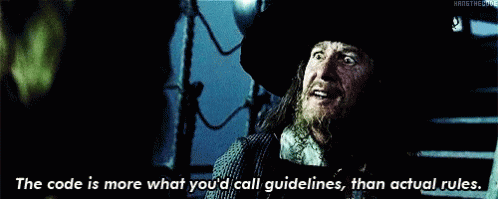

Something you'll come to appreciate after a little bit of practice is that **code is read far more often than it is written.** 

You write code once. Then in six months you'll read it again to remember how you solved a particular problem. You'll share your code with a coworker or colleague, who will want to understand and possibly modify it to fit their use case. You'll come back in a year to re-write and extend your code. If you're lucky, you'll get the chance to share your code with someone else in a code review.

Even though it may take a little bit of time at first, **properly formatting your code and making it easier to read will save you and everyone else a lot of time and headache later.**

Just think, you'll probably be trying to read your code at 4:45 on a Thursday before a long weekend and you've got to make this one change before you leave. Do yourself a favor: make it easy to read from the beginning.

**Python style is defined by [PEP (Python Enhancement Proposal) 8](https://www.python.org/dev/peps/pep-0008/)**, authored by Guido van Rossum and other core Python developers. We'll cover a couple of the core points here.

Some people take a sort of pride in writing code in a unique, personal style. I've heard people claim that it's job security—if they're the only ones who can decipher the code for a critical application, it's harder to fire them. On the contrary, **clean and well-documented code is an indication that you're a team player** and focused on the group's success. In my experience, this can have a greater positive impact on your career than jealously guarding what you've done.

## Whitespace Matters

If you've done any programming before, you're probably used to using `{}`'s and `;`'s to define blocks of code and ends of lines. Python doesn't use either of those, but rather uses **whitespace and indentation level to structure the code.** 

The accepted standard is to use **four spaces to indent code and define a new block** (the contents of function or class definitions, context managers, try/except clauses, loops—all of which we'll touch on later). This is so common that most text editors and IDEs will have a setting to replace any `tab` keypresses with four spaces instead.

A blank line can be used (sparingly) to **separate chunks of code into logical groupings**. However, a lot of the time it makes cleaner code to pull these chunks out into their own functions.

Indentation can also be used to **make lists, tuples, and dictionaries easier to read**. When you type the opening `[`, `{`, or `(`, python then ignores any whitespace after that, allowing you flexibility in how you define these structres in your code.

## Coments

Comments begin with a `#` and **anything after that is ignored by Python**. You can start them at the beginning of the line or at any point in a line (if you want to ignore the rest of the line. For in-line comments, it helps to use two spaces between the end of the evaluated code and the the `#`.

Good comments, like good code, are something of an art form. **Comments should tell _why_ you're doing something, not _what_ you're doing or _how_ you're doing it**. The goal is that the code itself should tell _what_ and _how_. However, I make a couple of exceptions here:
* **Complex or unfamiliar code**: When you're starting out, interpreting the code isn't a quick and seamless operation. What is obvious to an experienced programmer may take some time for you and I to understand. You may be trying out certain langauge features for the first time and need to remind youreslf what it's doing.
* **Marking sections of code**: Like the spacing example above, you can improve readability (or rather comprehensibility) by marking chunks of code with a comment.

In testing and development, you'll often use comments to make notes to yourself or comment out lines of code that don't work or you want to try something different. That's perfectly fine, but **don't leave them in your production code**. 

Once I've got something working, I've rarely gone back and needed the commented-out stuff. **Months or years later you won't remember why it's commented out, if its worth keeping or not.** It's like all those boxes of old Christmas lights I have in my garage- I don't know which strands are good and which are garbage. Be better than me- clean out the garage.

## Naming Conventions

Using the same formatting for specific names makes it easy to see at a glance what a particular variable refers to. It also ensures consistency with other programmers (except for ArcPy, which is special...).
* Variables, function and method names: `all_lower_case_with_underscores`
* Classes: `CapitalizedWordsWithoutSpaces`
* Constants: `ALL_CAPS_WITH_UNDERSCORES`

Choosing good variable and function names is a difficult but important task. When you're trying to quickly get an idea out of your head and into code before you forget it, it's tempting to use abbreviations and non-sensical variables. **Resist this urge**. Your brain will thank you later. 

Choosing good variable names goes a long way towards making your code self-documenting. Why double your typing and reading work when you can use descriptive variable names?

Do as I say, not as I do:
* [some old, comment-riddled code](https://github.com/jacobdadams/rcp/blob/master/methods.py#L100-L150)
* [even more code](https://github.com/jacobdadams/rcp/blob/master/raster_chunk_processing.py)

## Modularity

One of your style goals when writing a script should be to **have as few hard-coded "magic values" sprinkled throughout the body of your code as possible**. These should instead be saved as variables at the beginning of your program.

Let's say you're writing code to generate public notice maps and mailing lists for Planning & Zoning, and CUPs require a distance of 300 feet while rezones require a distance of 500 feet. You could just have the literal values `300` and `500` in the arguments you pass to the buffer function, or you could specify `cup_buffer = 300` and `rezone_buffer = 500` and use these variables instead. Now, when you re-read your code later, it's clear what those numbers represent. 

Using variables instead of magic values **allows you to easily change the value in a single place later without risking forgetting to change it in multiple places**. If the County Commission decided rezone notification should be 1000 feet, you just have to change that one variable and know that both your mapping and list generating code will use it.

# Exercise: Comparison and segmentation

## 1. String comparison and formatting

Loop throug the following list of county names. Using [string methods](https://docs.python.org/3.7/library/stdtypes.html#string-methods), change any names that aren't already Title Case (and only those that aren't) to Title Case and print them (and only them). Your code should ignore the strings that are already Title Case.

`['Cache', 'DUCHESNE', 'davis', 'millard', 'wASATCH', 'Box Elder']`

## 2. String segementation: slicing

Let's assume we're working with parcel numbers in a xx-yyy-zzzz book-page-lot format. Using string slicing (`[x:y]`), separate `'06-019-0009'` into its book, page, and lot pieces. Using f-strings, print out the following:
```
Book: xx
Page: yyy
Lot:  zzzz
```

## 3. String segmentation: string methods

Replicate the previous example but find a built-in [string method](https://docs.python.org/3/library/stdtypes.html#string-methods) that will divide the parcel id on `'-'`.

# Troubleshooting and Error Handling

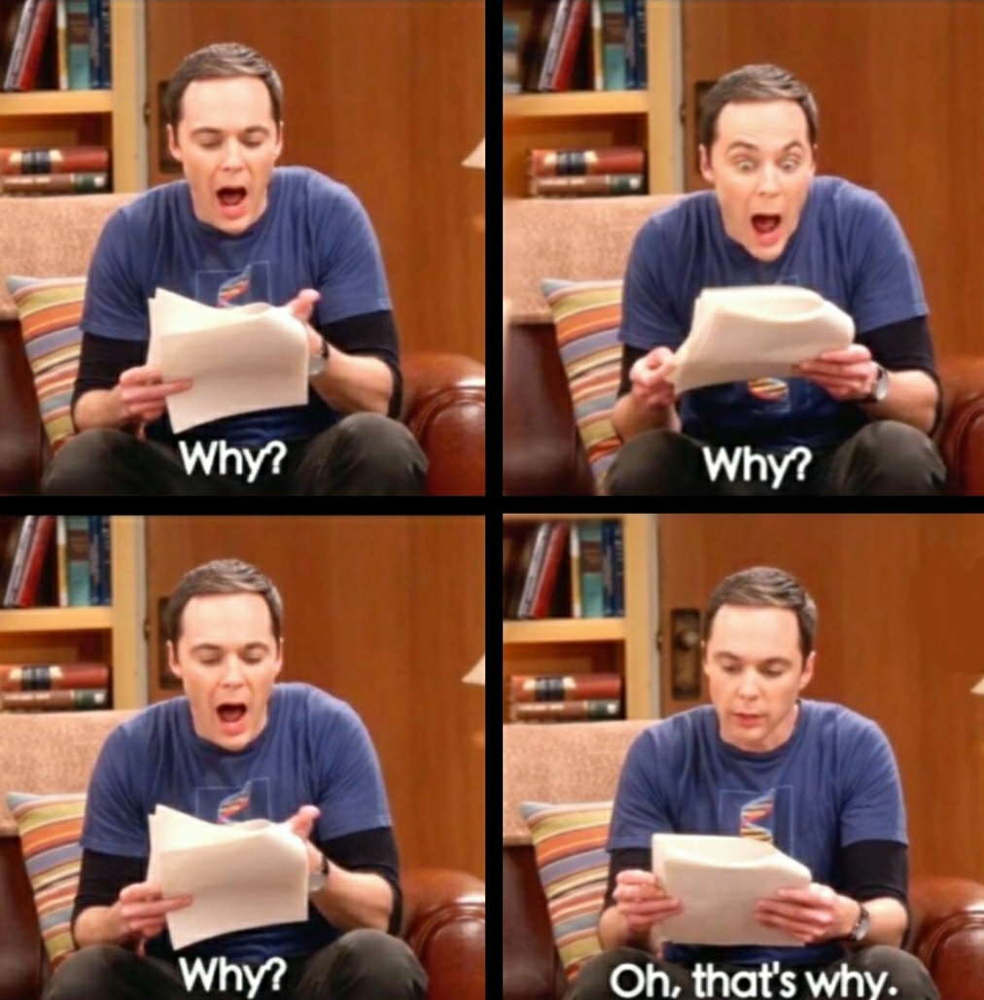

One of the fun™ parts of programming is spending fifeen minutes (or three hours...) tracking down a bug that takes five seconds to fix once you know where it is. In seriousness, though, **some of my most rewarding experiences programming come from finally solving a complex problem after much work and questioning of my own sanity**.

The key to troubleshooting is **understanding what the state of your program is at each step.** The Python debugger and the debugger tools built into IDEs are invaluable for this, but they take some getting used to. We'll cover some simpler, easier to use methods that are useful in their own right.

Problems in Python code can be broken down into two different categories:

* **Syntax errors**: A typo or other invalid python expression (mismatched quotes, missing close parens or colons, etc)
* **Exceptions**: An problem that occurs when you try to run the code (type errors, division by zero, invalid file paths, etc)

## Syntax Errors

Syntax errors can be a little difficult to debug at first, because the console just reports `SyntaxError:` and some sort of sometimes-helpful descrpition. However, the **traceback printed shows an error at the earliest point in the code where it was detected**. While this doesn't always correspond with the actual error, it's a good place to look:

## Exceptions

**Run-time errors are called exceptions**. These can come from a mistake in your coding or as a result of bad or unexpected input:

## Understanding the traceback

Whenever an error or exception occur, Python prints the traceback. The traceback tells you what error happened and where it was in the code when it happened. **We read the traceback from the bottom up**. Let's look at an example traceback, going from bottom to top:
```
Traceback (most recent call last):
  File "c:\gis\git\presentations\UGIC\2021\IntroToPython\utilities.py", line 16, in <module>
    cleaned = create_county_key('UT_SANJUAN')
  File "c:\gis\git\presentations\UGIC\2021\IntroToPython\utilities.py", line 10, in create_county_key
    return cleand_name
NameError: name 'cleand_name' is not defined
```

`NameError: name 'cleand_name' is not defined`: This is the **error type** (errors are objects just like everything else) and the error message. In this case, it's a coding error—I typoed a variable name.

```
  File "c:\gis\git\presentations\UGIC\2021\IntroToPython\utilities.py", line 16, in <module>
    cleaned = create_county_key('UT_SANJUAN')
  File "c:\gis\git\presentations\UGIC\2021\IntroToPython\utilities.py", line 10, in create_county_key
    return cleand_name
```
This is **where the error occured** (in Jupyter notebook and iPython it will print out the surrounding lines for context and the line numbers instead). We follow this from bottom up as well: 

The error was detected in the line `return cleand_name`, which was `line 10` in the function `create_couty_key` in the file `c:\gis\git\presentations\UGIC\2021\IntroToPython\utilities.py.`

This function was called from the line `cleaned = create_county_key('UT_SANJUAN')`, which was `line 16` of the file `c:\gis\git\presentations\UGIC\2021\IntroToPython\utilities.py` that was called as a module (`<module>`). As we'll see, anytime you run a python program from the command line it is considered a module.

This bottom-up approach allows you to **work your way through more complex programs that may traverse several different function calls over several different files.**

## Common Errors

For your reference, here are some common errors and their potential causes:

* `AttributeError`: When you're trying to access data or a funciton from an object that **doesn't have that specific method** (ie, a list doesn't have a `.upper()` method)
* `IndexError`: When you try to access a **list/tuple index that doesn't exist**. If you're sure the index number is correct, it may mean your collection is empty or being populated differently than you expect.
* `IOError`: When you try to access an **IO resource (like a file) that doesn't exist or has problems**. This could be caused by a mistyped file path or a file that hasn't been created yet.
* `KeyError`: When you try to access a **dictionary key that doesn't exist** for that dictionary.
* `NameError`: When you try to use **a variable/function/class that you haven't defined**. As we saw above, this can be caused by a typo in your variable name, or it could come from trying to use a method from a module you haven't imported yet.
* `TypeError`: When you try to do something to or with an object that it **doesn't support**. For example, you can't add the int `5` and the str `'10'` - one is a number, the other a sequence of characters. You'll see this when working with input that you forget to convert to a number, when reading data in from a file that you expect to be one type but is another (akin to a feature class attribute that's text instead of a long), or when building strings (sometimes it automatically translates numbers to text, other times not). 
* `ValueError`: When a function gets the **right type of arguments but the value is incorrect and there's not a more appropriate error**. You'll see this if you try to unpack a tuple to the wrong number of new variables. It's also a good choice for errors that you raise manually.

## Handling exceptions: Forgiveness > Permission

We can make our programs more robust by anticipating and handling exceptions in our code using `try`, `except`, and `finally` blocks. 

One of Python's principles is that **["it's easier to ask forgiveness than permission."](https://docs.python.org/3.7/glossary.html#term-eafp)** For example, instead of checking to see if a file exists before opening it, you would **try to open it and deal with any errors that come up.** This results in more readable code because the desired operation comes first, and then you get to any error checking/handling. Otherwise, the desired operation can be buried under a mountain of checks.

To handle errors, you'll **wrap your desired code inside a `try:` block**. Then, you'll write one or more `except` blocks to handle specific errors. You can use an optional `finally:` block to include code that should always be run, no matter if an exception is thrown or not. 

You can also raise your own exceptions with the `raise` keyword.

You should try to **make your `try` blocks as small as possible**, covering just the code that you anticipate throwing an error. Otherwise, you may catch something and be looking for a fix in the wrong place.

If you absolutely have to be sure you're catching all possible errors, you can add a `except Exception as error` block as well. You can then reference the original error as `error`. However, **this can hide other errors and should be used sparingly** if at all.

## Troubleshooting tips

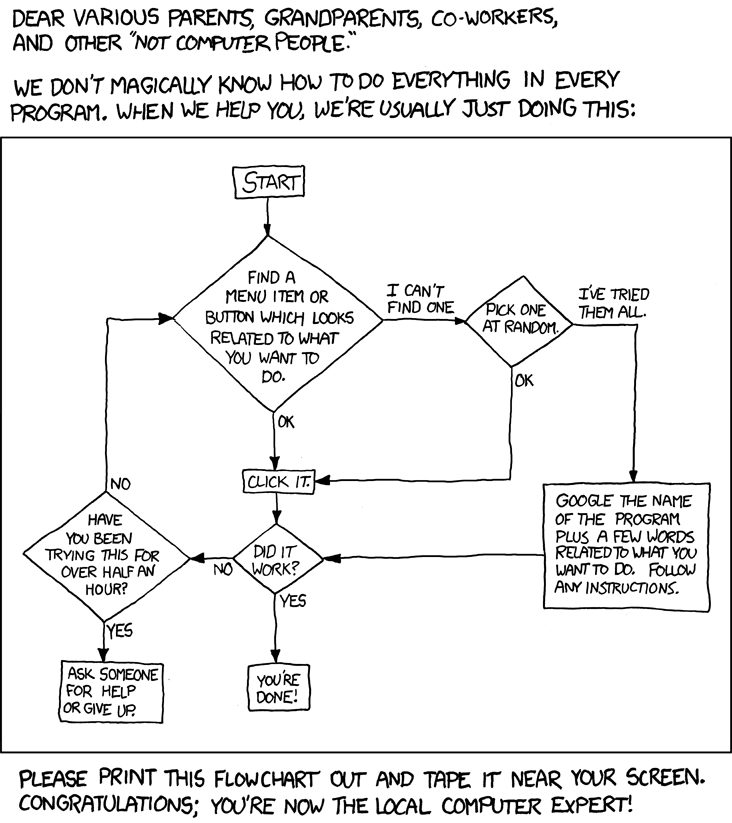

The simplest way to see the values of your variables at certain times is to **sprinkle your code with `print()` statements,** passing in the variable in question. This can give you a pretty good idea of what's going on when.

Just be sure to remove these once you've found your problem (and don't just comment them out!).

If you're not sure where to start looking, use a **divide and conquer strategy**: check the values in the middle of your program. If they're correct, you know the problem is in the second half; if not, it's in the first. Do the same thing in the problem half, and then do it again and again until you've narrowed it down.

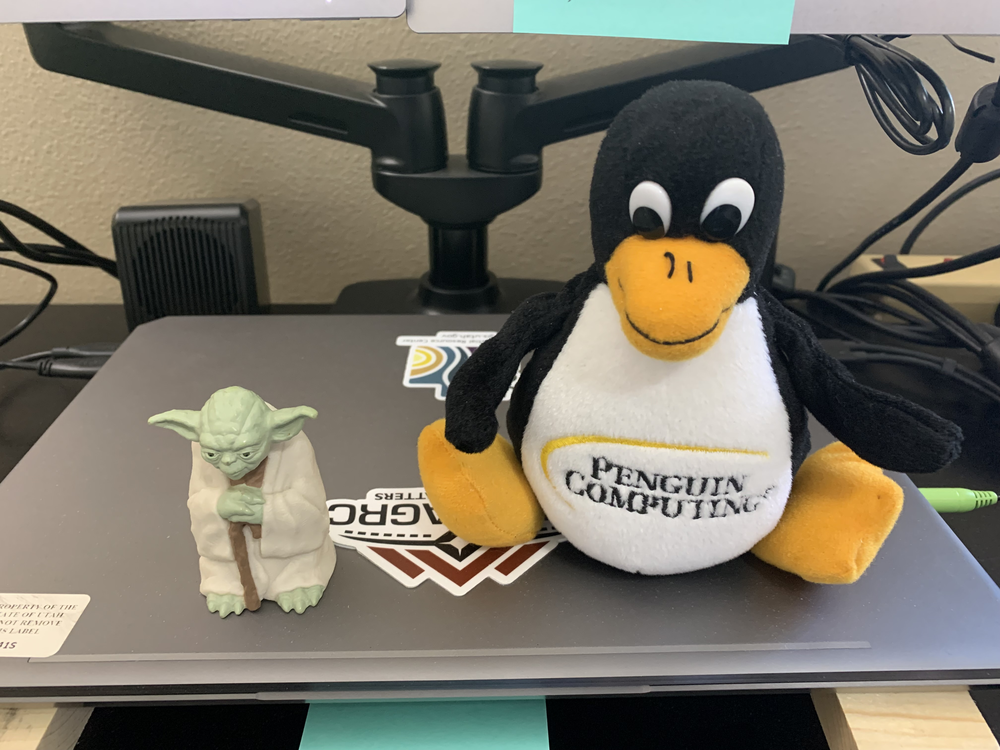

Another really useful tactic is **Rubber Duck Debugging**. Talk through your code, every line. Explain what it should be doing. More often than not, you'll find that you did something small and obvious when you see it. 

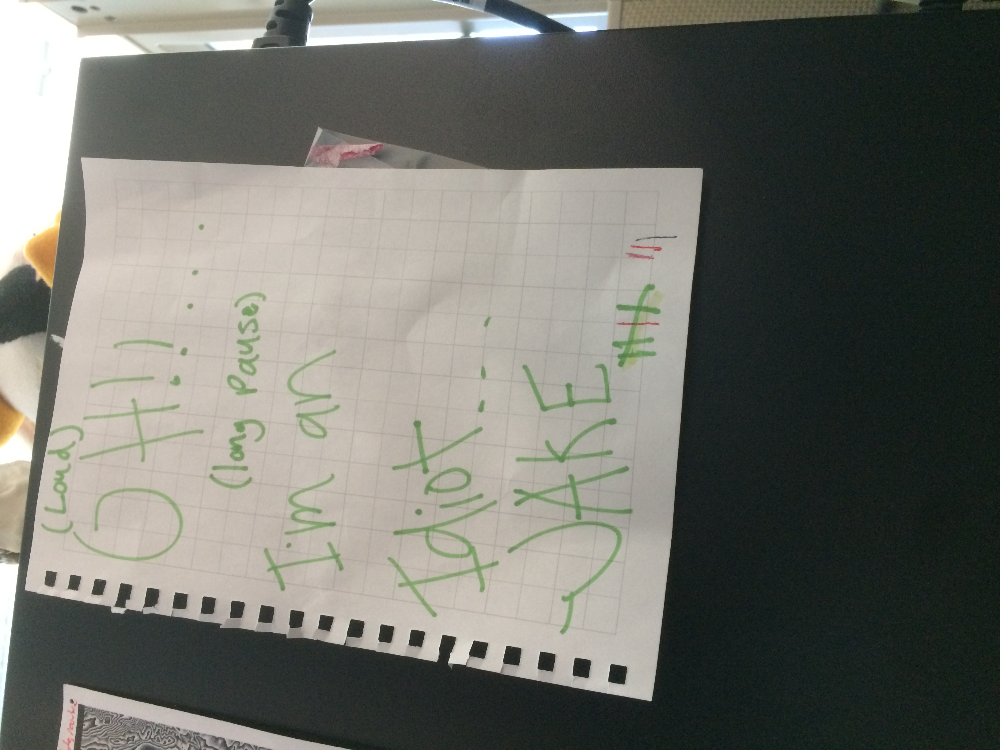

# Functions

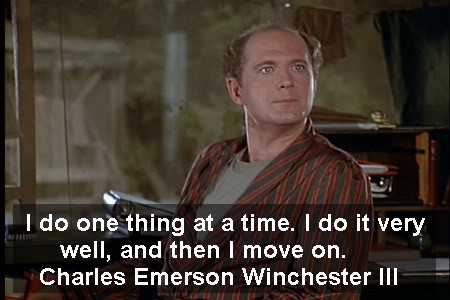

_Functions_ are a **self-contained collection of code that operate on values passed into it (its arguments) and returns any resulting data (it's return values).**

Functions are an import tool in creating easy to read and easy to modify programs. They are the first step going from a script, a long collection of statements and variables, to an organized and efficient program. 


## It's a Matter of Principle(s)

A common use of functions is to eliminate identical lines of code repeated in several places. By replacing the duplication with a single function definition, you eliminate the risk of forgetting to change all the instances of that code if you need to modify what it does or how it operates. Programmers refer to this as the **DRY principle**: Don't Repeat Yourself. 

Functions should also follow the **Single Responsibility Principle**: they should only tackle one part of the problem and hide as much of the details about how it is solved from the person calling the function. 

By breaking your code up into functions like this, you can make it easy to follow the main, 10,000 foot level idea of what it's doing without getting bogged down in the minutiae of how it's doing it. 

## Defining Our Own Functions

We've already called several built-in functions: `print()`, `type()`, `range()`, `len()`, and so on. Any _arguments_ are passed in the parentheses in the order specified by the function definition (or by keyword, more on that later).

To define our own function, we write `def function_name(argument1, argument2, argument3='foo', argument4='bar'):` and then use indentation to define the function body. We use the `return` statement to hand information back to the calling code. `return` doesn't have to be at the end of the function code; if it makes sense to return in a conditional or a loop, by all means return early. 

For example, this function takes county names in the format `STATE_COUNTYNAME` and returns just `countyname`, lowercased and any spaces or periods removed. It handles a single part of a much larger task and allows the programmer to reuse this logic as often as needed.

It also demonstrates how functions can be _chained_. `name.split(separator)` returns a list, and we get the last element of that list with `[-1]`. That is a string, so we can call `.casefold()` on it. `.casefold()` also returns a string, so we call `.replace()` on that, and so forth.

## Arguments (not the political kind)

A function defines **zero or more arguments that allow you to pass information into the function to operate on**. `create_county_key()` has two arguments: `name` and `separator`.

When you call a function, you specify which argument you're passing based on either the position, separated by commas (as in the first example), or by using the argument name and an equals, `arg=`, in the function call. This can help make it clear what the data going into the function will be used for.

When we define functions, we can make some arguments **optional by giving them a default value in the function definition**. Now, when we call the function we only have to provide the default parameters if they're going to be different.

## Side Effects May Include...

Remembering that everything in Python is an object, `name` does not create a copy of the value of `original_name`. Instead, it **passes the reference, or the memory location, of the object to our function**. This distinction doesn't matter much for immutable objects like strings, but can bite you with things like lists.

Let's say we want to check a list of county names. If they have a `_` in their name, we'll fix them and reassign their name to the cleaned name.

While this works, there are two problems:
1. `counties` has now been **modified**. What if you were relying on the order of that list? Or if there was another part of your code later on that needed the original values?
1. Our function now has **two jobs**: clean the name and manage the existing list. 

Our function now relies on a _side effect_, rather than returning a value. You should generally **avoid side effects because they make it more difficult to quickly read and understand the code, debug the code, or share the code** via modules and importing. 

Let's fix our function by returning a new list instead. 

## Keep it simple, keep it safe

As noted, functions should be relatively small. One developer, [Sandi Metz](https://www.youtube.com/watch?v=npOGOmkxuio), suggests that they should **only have five lines of code and no more than 4 arguments**. While this makes sense for well-designed object-oriented code, it may be a bit unrealistic starting out.

The main principle goes back to the begining: **do one thing, do it very well, and then move on**.

# Exercise: Functions

* Basic function that returns info
* Function with defualt args
* Create some function names to decompose a larger problem

## 1. Basic Function

Write a function that takes the following list of names and returns another list that doesn't have any duplicates.

`['Zach', 'Jake', 'Jason', 'Jordan', 'Zach', 'Sam', 'Jake']`

## 2. Default Arguments

Modify your function to include an argument for a name allowed to be repeated and set its default to `''`. Call it once without specifying the argument, once with specifying `'Zach`', and once with specifying '`Jordan`'.

## 3. Framework Functions

Come up with a series of function names, their arguments, and their return values for baking [pumpkin chocolate chip cookies](https://www.twotwentyone.net/pumpkin-chocolate-chip-cookies/). Think of common operations, and think of their inputs and outputs. 

For example, a `microwave_oatmeal()` function could have arguments `oatmeal_amount`, `water_amount`, `time`, and `power` and return a string representing the state of the oatmeal (`'too hot'`, `'too cold'`, etc):
```python
def microwave_oatmeal(outmeal_amount, water_amount, time, power='high'):
    return oatmeal_state
```

# Imports: Not just for shipping companies

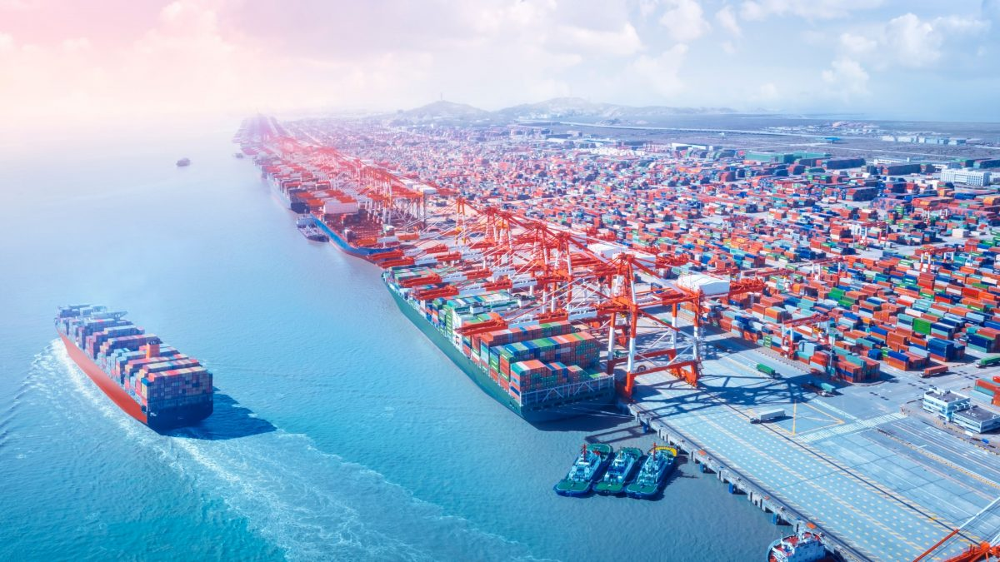

A _module_ is Python's name for a **collection of code that can be imported into other programs**. A module is defined by a file with the `.py` extension, so your scripts are probably already modules. 

For most everyday purposes, a _package_ is a **directory of modules with an additional `__init__.py` file.** This is how other libraries, like `arcpy` and `pandas`, provide access to all their code: `package.module.function()`.

## Importing code

Python prides itself on being a "batteries included" langauge. **There are a ton of different utilities available in the standard library**. There's also a thriving ecosystem of 3rd-party packages on [pypi](http://pypi.org) and [conda](https://docs.conda.io/en/latest/). 

To use any of these libraries, you have to **import the relevant modules into your program.** Importing copies the specified package, module, or method into the _namespace_ (collection of available variables and functions) of your program. It also runs any executable statements in the module (code that isn't indented).

There are **several different ways** to import pcakges/modules/functions. We'll use the `os.path.join()` method to demonstrate the different ways to import the `join()` method from the `path` submodule of the standard library `os` module.
* `import os`—load the entire os module. Call join() by `os.path.join()` (and anything else in `os`)
* `import os.path`—just load the path submodule. Call join() by `os.path.join()`.
* `from os.path import join`—only load the join() method. Call by `join()`.
* `from os.path import *`—load every method in the path submodule. Call by `join()`.
* `import os.path as op`—load the path submodule under the name op. Call by `op.join()'.

Practically, there's not a lot of difference between `import os.path` and calling `os.path.join()` or using `from os.path import join` and calling `join()`. The first provides context about which `join()` method you're using (ie, the one from os.path), and the other saves you from the verbosity of typing `os.path` everytime you call the method. 

While `from x import *` is fine for interactive prototyping, you shouldn't use this in production code. Because it copies all the names from the module into your module's namespace, it can **create conflicts when you use a variable with the same name.**

## Where does python look for modules?

When you try to import a module, Python tries to find it in three places:
1. The input script's directory (`python my_script.py`, Jupyter notebook `.ipynb` files) or the command prompt's current directory (python command prompt, iPython)
1. The `PYTHONPATH` environment variable.
1. A default location dependent on the python installation.

Fortunately, **conda and pip take a lot of the leg work out of worrying about the last two paths**. If you're in a conda virtual environment and install a package through conda or pip, you can trust that it will be available to import.

The first search location, the script's directory or the current directory, gives us the ability to **divide our program into multiple files** (aka modules) and refer to them in a main script/module. It also allows us to **import a module when we're working in the interpreter**, which is useful for testing and development. 

## `if __name__ == '__main__'`: Writing an importable program

Under the hood, whenever a module is run it creates the `__name__` variable and sets it to the root name of the file—ie, `tools.py` becomes `tools`.

However, if you run a module from the command line (`python my_module.py`), `__name__` is set to main. This allows us to write a script using a bunch of functions that can be imported by another program if desired but can also be run as a stand alone program.

We do this by **adding the check `if __name__ == '__main__':` at the end of our file and then writing all our function-calling code in that block.**

This is a very common pattern that you'll probably see in the wild.

Let's take our create_county_key method and save it in a module called `utilities.py` in the event directory. Now we can import the module into our Jupyter Notebook session and call the function from that file:

Next, let's add the following lines at the end of `utilities.py`:

Now we can run it from the command line and we should see `This is from the script!` and `cache` printed out. However, if we import the module, it won't run that code because `__name__` will be set to `utilities`. 

What happens if we don't use this check? Let's add a couple lines above the name check and then re-import the code. To do so, we use `importlib.reload()` to replace the cached version of the module that was created when we first imported it.

We'll also run it again from the command line to see that it does both calls.

# Put the REPL Down and Step Away from the Console!

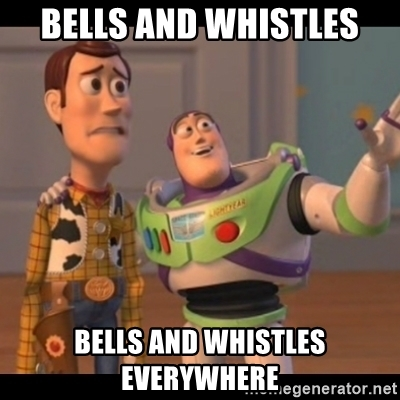

iPython and Jupyter Notebooks are great for testing snippets of code and developing the individual steps of your program, but you'll need to use a **text editor or Integrated Development Environment (IDE) to write .py files and really develop programs of meaningful length.** 

## Editor bells and whistles

A good editor will offer several features that will make your life as a programmer much easier.
* **Syntax highlighting**: Just like in these notebooks, a good editor will color your code differently based on its type. Method names are one color, strings another, and ints/floats another still. 
* **Code folding**: Collapse blocks of code that you're not currently working on.
* **Line numbers**: Critical for debugging and troubleshooting.
* **Interactive code hinting**: Auto-complete, IntelliSense, interactive method signatures.
* **Built-in debugging**: Stepping through your code line by line, allowing you to track values and logic flow.
* **Auto formatting**: Automatically enforce line length, line separation, and a host of other style conventions.
* **Linting and error checking**: Warn about poor style choices and potential run-time errors (accessing variables that haven't been defined, missing closing brackets, etc.
* **Version control**: Built-in support for git (and other VCS) and GitHub.

## Available Editors and IDEs

There are several good editors and IDEs available. Editors usually have limited features compared to IDEs; **I'd really recommend going with an IDE.**

Editors:
* Notepad++
* Vim/Emacs
* Atom
* Sublime Text

IDEs:
* Idle (comes with python)
* Visual Studio Code (VS Code)
* PyCharm
* Spyder
* Eclipse


## Getting set up in VS Code

VS Code provides a good balance between text editor and full-bore IDE — and it's free! We'll go over how to set it up for a smooth Python experience.

First, `conda install` the following packages into your project's virtual environment to support some of the automated features:
* `pylint`—Linting
* `yapf`—Formatting

Next, open VS Code and install the following extensions from the Marketplace:
* Python—Foundational Python support
* Pylance—The latest "language server", providing better code hinting

**The best way to organize your code for working with VS Code is to put it in folders**. I start a new git repo for each project, but if you're not ready for git just yet you can just create individual folders or create one main "scripts" folder (or something like that).

Once you've got your folder set up, I generally **launch VS Code by right clicking on the folder in Explorer and select "Open with Code"**, or by right clicking on the taskbar icon and selecting the folder. This allows you to see all the different files in the folder and to store project-specific files (readmes, config files, etc) in a sensible location. 

Now that you've got your folder structure in place, create `setup.cfg` in your program's root directory and paste this in to guide the **formatter** `yapf` (based on the [Google Python style guide](https://google.github.io/styleguide/pyguide.html#3-python-style-rules)). Note that we use a wider line width than Google; this is one of those "guideline" things.

```
[yapf]
based_on_style=google
ALLOW_SPLIT_BEFORE_DICT_VALUE=False
COLUMN_LIMIT=120
COALESCE_BRACKETS=True
DEDENT_CLOSING_BRACKETS=True
EACH_DICT_ENTRY_ON_SEPARATE_LINE=True
INDENT_DICTIONARY_VALUE=False
SPLIT_BEFORE_DOT=True
```

We'll also add `pylintrc` to this folder with the following contents for **linting**:

```
[MASTER]
load-plugins=pylint_quotes
max-line-length=120
disable=bad-continuation,broad-except
ignore-patterns=test_.*?py
ignore=secrets.py,example.py
generated-members=arcpy.da.SearchCursor,arcpy.da.UpdateCursor,arcpy.da.Describe,arcpy.env.scratchFolder,arcpy.env.scratchGDB
```

Now we'll change our preferences in VS Code to use all these different tools. 

In VS Code, open the preferences by hitting `ctrl-shift-p` (which brings up the command window) and typing `preferences`, or going to File > Preferences > Settings.
* Search for `pylint` and scroll until you see "Python > Linting: Pylint Enabled" and check the box to allow pylint to check your code for style and other formatting errors.
* Search for `yapf` and make sure "Python > Formatting: Provider" is set to "yapf"
* Search for `column` and set both "Editor > Minimap: Max Column" and "Editor: Word Wrap Column" are set to 120 (or whatever the `COLUMN_LIMIT` is set to in `setup.cfg`)
* Search for `wrap` and set "Editor: Word Wrap" to "wordWrapColumn"

Every time you save, `yapf` will format your code. This may break some of your custom code formatting, and that may drive you up the wall. My personal experience is that **once you let go of your custom formatting and accept the common style, you'll soon not even notice. In addition, your code will be easier to read by a much wider audience.** 

Whenever you open a new folder, you'll need to select the conda environment you want to be working in. This controls both what installed packages are available for code hinting (like `arcpy` or `pandas`) and what editor tools (`yapf` and `pylint`) are available for VS Code to use while editing. 

If you want to change this later, you can click on the text listing the current environment in the status bar at the bottom to bring up the Select Interpreter dialog.

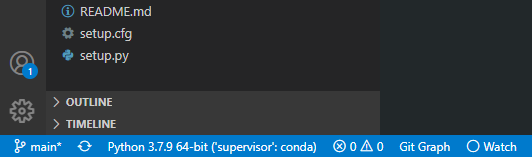

# Working With Files and CSVs

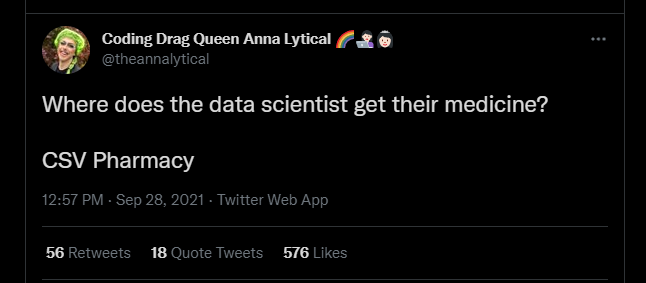

Working with text files in general and CSVs in particular is a very common operation. Python provides tools for reading and writing them row-by-row in to or out of the data structure of your choice. Pandas provides a whole world of table-based data operations but deserves a session all to its own.

## Context matters: reading and writing text files

We use the built-in `open()` function as a _context manager_ to work with files. `open()` takes a "path-like" argument for the file location and an additional code for what mode the file should be opened in—read, write, or append. 

First, let's use mode `'r'` to read a csv into a list of it's lines.

Now, we can write that back out to a new file using `'w'`.

If we run that last cell again, we see that it just overwrites the existing file. If we wanted to append, we'd instead use mode `'a'`.

We're introducing a new concept here: _context managers_. A context manager is used when **you are performing an operation that requires certain set-up and take-down procedures and needs to guarantee they'll be done even if the main action throws an exception.** They're basically a shortcut for some tedious error handling.

To use a context manager, we use `with` followed by a method that returns an object that supports the context manager dunder methods (like `open()`) and give it a name with `as` to access it later on.

The non-context manager version of working with a file requires three steps:
1. Open the file.
1. Read or write the file.
1. Close the file.

If there is an error reading/writing the file and you don't close it, the operating system won't know what to do with it and it could become corrupt or unreadable. The context manager ensures that happens.

You'll also see context managers used for arcpy's cursors that provide access to feature class attribute tables.

## Binary vs text, and going down the text encoding rabbit hole

On your hard drive, all files are binary: a pattern of 0s and 1s. **Different patterns (or _encodings_) are assigned different file types**—one pattern may be a shapefile's `.shp` file, another a TIFF file. When you're working with these files, you have to write (or import) a file reader that knows that pattern and loads the data appropriately.

The `open()` method provides the mode `'b'` to open a file in binary mode. Every time you call `read()`, it reads a certain number of bytes from the file and moves the read point ahead, kind of like a tape player.

Plain-text files are so ubiquitous that **several common encodings have been defined to read and write text data**. Python wraps all this up in the special text mode `'t'` (which is the default for that argument, which is why we could leave it out altogether earlier). By using text mode, Python knows to interpret that sequence of bytes as a string.

Generally speaking,* in the English-speaking realm letting Python choose a default text encoding won't harm you, and you'll see a lot of examples online that leave off the `encoding=` argument to `open()`. However, **it's safest to always specify `encoding=utf-8` when writing out files**, especially if they contain any special (non a-z, A-Z, 0-9, standard punctuation) characters.

>\* Like any good asterisk, this hides quite the iceberg of technical trickery. See [The Absolute Minimum Every Software Developer Absolutely, Positively Must Know About Unicode and Character Sets (No Excuses!)](https://www.joelonsoftware.com/2003/10/08/the-absolute-minimum-every-software-developer-absolutely-positively-must-know-about-unicode-and-character-sets-no-excuses/) by one of the founders of Stack Exchange. 
>
> Or, watch the Computerphile video below

In [ ]:
YouTubeVideo("MijmeoH9LT4")

If you get gibberish when reading a file, you may need to specify different encodings in your `open()` method. Start with `utf-8`, and then [explore](https://docs.python.org/3/library/codecs.html#standard-encodings) from there.

## Other modes

In summary, here are all the modes. You combine the encoding mode, `t` or `b`, into one string with the oepn mode, so to write a text file the mode is `tw`.
* `r`: **read** an existing file
* `w`: **write** a new file, overwriting an existing file
* `a`: **append** to the end of an existing file
* `x`: write, but fail if the file already **exists**

## CSVs: Because plaintext is boring

If we wanted to get the individual values in the list we read in from our example file, we could split each line in the list on `','` and then remove the `\n` at the end of the line. However, **Python's built in `csv` module does all this heavy lifting for us, making it easy to read and write CSVs.**

To do this, we first have to import the `csv` module. We then `open()` the file like before, but then we create a `csv.reader` or `csv.writer` object from our file object and use that to read/write. The `reader` returns a list of strings for each row in the file, and the `writer` allows you to write a collection to each row.

And writing is similar:

What happened? The `csv.writer()` object automatically adds the appropriate newline characters to each line it writes, but then the `open()` file object adds its own new newline characters. So, **when we `open()` the file, we need to tell it not to add these extra characters:**

If you want to **pull your CSV into a row of dicts based on a header line** (or your own specified column names), you can use the `csv.DictReader` and `csv.DictWriter` objects. These actually use OrderedDicts, which work just like dictionaries but guarantee the order of the keys within each dict.

Likewise, a `DictWriter` will write out a dictionary to a CSV row, using the `fieldnames` argument for the header and the order the dict's keys are written:

There are modules for reading in excel data, but saving the desired sheet as a CSV can be easier. 

**Pandas also provides methods for reading CSVs and excel files directly to dataframes and can be a quick way to ingest data.**

# Paths: Choose Yours Wisely

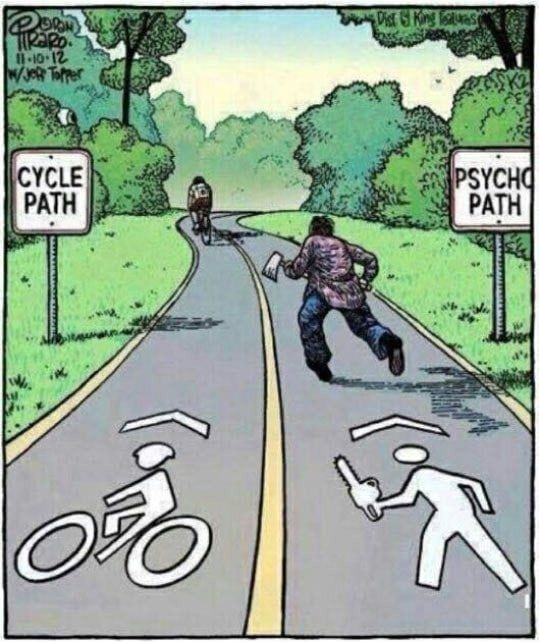

In the file and csv examples, we just used strings to represent the file locations. You'll often need to work with these paths programatically—creating new paths, navigating up or down the directory tree, or seeing if a file already exists.

Python provides two ways for dealing with paths: `os.path` (the old way) and `Path` objects (the new way). 

## `os.path`: Working with paths as strings

One of the most useful parts of using [`os.path`](https://docs.python.org/3.7/library/os.path.html) to work with paths as strings is **joining path parts without having to worry about using the right separator.** This is especially important if you're writing a script that needs to work on both Windows and Linux/Mac, which use different characters (`\` on Windows, `/` on \*nix) 

We can also check to see if a file exists (though in Python, it's generally advised to ask forgiveness than permission):

And we get the file/directory and parents of a path:

## `Path` Objects

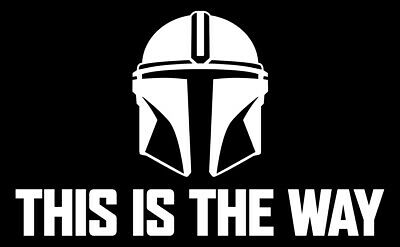

The `Path` objects provide a **more comprehensive and easier to use way of handling paths**. You create a `Path` object from a string like before. You can then access attributes of the object itself. and call a host of methods on it.

Under the hood, print first calls the `str()` method on its argument to get the string representation. `str()` in turn calls the dunder `__str__()` or `__repr()__` methods of the argument. Thus, **when we print a `Path` object, we get a string representation of its path. When we work with it directly, it's still the object.**

What if we want to get the file name (or final directory if it's just a directory)?

Or, if we want to go one folder up, we can use `.parent`

If we want to iterate through a directory, we can use `iterdir()`

And we can search a directory for all files of a specific type using `.glob()`:

## ... except when it's not the way

Frustratingly, **`arcpy` can not (yet?) handle `Path` objects**. However, they are still functionally superior to bare strings and you should still use them in your code. To pass them to `arcpy` methods, call the `str()` method on your object in the `arcpy` method call:
```
arcpy.management.GetCount(str(feature_class_path))
```

## Deleting Directories

There are different methods for deleting directories based on whether it is empty or not. 

If it's empty, you can use `os.rmdir()` on a string or the `.rmdir()` method on a `Path` object.

If it's not empty, and you're 100% sure you want to delete everything and you're 100% you've got the right path (there's no Recycle Bin here!), you can use the `shutil.rmtree()` method from the `shutil` module.

# Exercise: Text Files

Read some data in, like a csv from open data, analyze it, and then write it out to a csv in a subfolder created programmatically.

## 1. Reading  a csv and writing to another directory

Download the csv of the [Utah Municipal Boundaries](https://opendata.gis.utah.gov/datasets/utah-municipal-boundaries/explore?location=4.067700%2C-111.677790%2C-1.00) attribute table. Write the code to read it into a list of dictionaries, make a subdirectory in your working directory, and save the data out to a csv file in this new subdirectory containing only the columns `'NAME'`, '`SHORTDESC'`, and `'FIPS'`.

## 2. Imports and scripts

Modularize your csv code into one or more functions. Save it in a script that can be both be run from the command line and also imported. 

Hint: If you use multiple functions, you can use a main function that calls them all in the proper order.

# An Introduction to `arcpy`

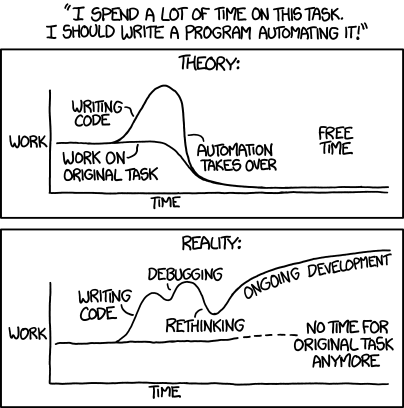

Now that we've got a solid Python foundation, lets get to using the ArcPy library!

ArcPy gives you **access to every geoprocessing tool in ArcGIS Pro in a scripted environment** (based on your licensing level). You can use it to create stand-alone scripts to manage and analyze data, or you can use it to create script tools that can be launched from within ArcGIS Pro like any other geoprocessing tool. If you have ArcGIS Enterprise, you can share these script tools as Geoprocessing Services and then access them in webmaps using the Geprocessing Tools widget.

## ArcPy Basics

The [arcpy intro page](https://pro.arcgis.com/en/pro-app/latest/arcpy/get-started/a-quick-tour-of-arcpy.htm) gives a pretty good overview of arcpy's basic structure. 

There are five main components to `arcpy`:
* **Tools** — You've got access to all the different geoprocessing tools in ArcGIS Pro. The method arguments match the options available in the GUI. Tools (usually) return a _results_ object. They are accessed via `arcpy.toolboxname.ToolName()`.
* **Functions** — These are helper functions that don't correspond to a GP tool or GUI component, things like listing fields or working with toolbox parameters. They return a variety of ArcPy objects or normal Python variables and are usually accessed by `arcpy.FunctionName()`.
* **Modules** - These are more involved operations organized into their own sub-modules. Some may include alternative ways of calling GP Tools. A common module is the `arcpy.da` Data Access module, which provides the cursors for accessing data row by row.
* **Classes** — Like their general Python counterparts, ArcPy Classes provide a convenient structure for creating objects that store more complicated data, like spatial references (`arcpy.SpatialReference`). Unlike general classes, though, they usually don't have any associated methods.
* **Environment Settings** — Just like their GUI counterparts, these set program-wide defaults and environment variables, like spatial references or raster grid size. Most commonly used to set the default GDB via `arcpy.env.Workspace`.

Most of the time, you'll use ArcPy's Functions, Modules, and Environment to create the framework for running Tools. Most Tools just use strings to define their parameters, but you'll occaisionally use Classes to handle more complex parameters. 

## ArcPy Documentation

ArcPy's docs are split in two different locations: the [Tool Reference](https://pro.arcgis.com/en/pro-app/latest/tool-reference/main/arcgis-pro-tool-reference.htm) and the [Python Reference](https://pro.arcgis.com/en/pro-app/latest/arcpy/main/arcgis-pro-arcpy-reference.htm).

### Tool Reference

The **Tool Reference documents GP Tools and Environment Settings** — everything that's in both the GUI and ArcPy. When you get to a specific Tool's page, under the "Parameters" section there will be two tabs: "Dialog" and "Python". The Python tab will give you the full name of the method, arguments and their data types, output and their data types, and some examples.

Because some Tools' results are accessed in a weird way (for example, `GetCount()`'s result is accessed like the first item of a list), the examples can be your best bet for figuring out how to use a tool. Take their example and play with it in iPython/Jupyter and see what you can access from the results object.

### A note on data types

The docs aren't always explicit and consistent about what inputs can be provided to a Tool. Here we **differentiate between the Python type of the argument itself, which is almost always a string for Tools, and the type of the data reffered to by the string**. For example, `arcpy.management.DeleteFeatures()` has the argument `in_features` which is said to be a `Feature Layer`, but the Explanation states you can give it a feature class, shapefile, or layer. So this works to delete Feature Layers (described more below), feature classes in a GDB, or shapefiles on disk, all referred to by a string of their name/path.

### Python Reference

You'll use the **Python Reference for info on ArcPy's Functions, Classes, and Modules**. It also provides general overview on how to use ArcPy and some of its more finer points. It's well worth your time to read through some of these overview docs.

### Google?

Sometimes, the best way to figure out how to do something is to search `arcpy <action>` in Google. Esri's [Python Community](https://community.esri.com/t5/python/ct-p/python) (aka Geonet) and the [GIS Stack Exchange site](https://gis.stackexchange.com/) are both good resources. I have found many solutions from these sites via Google.

## Accessing `arcpy`

The first step to using ArcPy is making sure the packages are available in your Python environment. 

The first and simplest way to install ArcPy is to **just clone the `arcgispro-py3` environment** like we did at the beginning. This includes the version of ArcPy that matches your installation of ArcGIS Pro.

The second method introduced with Pro 2.7 is to **install ArcPy via conda** (you must still have ArcGIS Pro installed!). Open the Python window as an Administrator, if you can (right click on the Python Command Prompt, More > Run as Administrator). Create your new environment without cloning anything, activate it, and then install `arcpy` from the `esri` channel:

```
conda create -n arcpy_env
activate arcpy_env
conda install arcpy -c esri
```

Now that it's installed in our environment, we just have to import the `arcpy` module and we can use whatever functions we'd like. This can take a few seconds to run.

## Accessing geographic data

ArcPy uses a **file-and-folder structure for it's paths to feature classes within a geodatabase**. For example, the full path to a `roads` feature class in a `Transportation` gdb would be `c:\temp\Transportation.gdb\roads`. We can access SDE data in a similar fashion, replacing the gdb with the path to the `.sde` connection file.

ArcPy provides three [cursors](https://pro.arcgis.com/en/pro-app/latest/arcpy/data-access/what-is-the-data-access-module-.htm) from the Data Access Module for accessing individual features: 
* `arcpy.da.SearchCursor`: **Read-only** access
* `arcpy.da.InsertCursor`: For **adding** new features
* `arcpy.da.UpdateCursor`: For **updating** existing features

`SearchCursor` and `UpdateCursor` return tuples and lists (respectively) for each row containing the values of the fields specified in their function calls. Correspondingly, an `InsertCursor` can be used to write a new feature provided as a list or tuple of values.

Cursors support context managers, taking care of the open and closing operations. 

Any inserts/updates to certain datasets, including versioned datasets in enterprise GDBs, requires an [edit session](https://pro.arcgis.com/en/pro-app/latest/arcpy/data-access/editor.htm). 

## Environmental scratch pads (and GDBs)

Just like in Pro, ArcPy supports the idea of a _workspace_, or a sort of **default GDB**. This is similar to the concept of the Default GDB in Pro. Many tools will read or write feature classes to this location if you don't specify a full file path when you call them.

You can set the current workspace Environment Setting using a simple string path:
```python
arcpy.env.workspace = r'c:\temp\project.gdb'
```

ArcPy also provides an on-disk [scratch GDB](https://pro.arcgis.com/en/pro-app/latest/tool-reference/environment-settings/scratch-gdb.htm) and [scratch folder](https://pro.arcgis.com/en/pro-app/latest/tool-reference/environment-settings/scratch-folder.htm). These are a great places for storing **temporary or intermediate data you don't want to save**. DO NOT save anything here you need to keep!

You can't set either of these variables, but you can use them as a base path for other data.

## `memory`: My mind ain't what it used to be

An even **faster place to store intermediate data is the `memory` workspace**. This never gets written to disk; the output is stored in memory (RAM) and is available until you [delete](https://pro.arcgis.com/en/pro-app/latest/tool-reference/data-management/delete.htm) it or your script finishes. 

You can access this by creating a string beginning with `memory`: `r'memory\output_feature_class'`

## Selecting data: onions have layers, ArcPy has layers. End of Story. 

What if you want to select specific features? In Pro, there are **two ways to do this: Select by Attribute or just put a definition query on the whole layer**. To do this in ArcPy, we need to create a _Feature Layer_ from our feature class. This is the virtual equivalent of adding a feature class to a map, except there's no map. It just sits in memory waiting to be used. If we don't save it, it disappears when we exit. 

When we make a layer, we can add a `where_clause`, which acts like a definition query. Or, once we've created the layer, we can run Select Layer by Attribute.

You might expect the `MakeFeatureLayer` Tool to return some sort of layer object. However, we instead **pass the name we want to give the layer into the Tool as a string, and then we can refer to that name (as a string) in any other Tools or Functions that understand layers.** The layers just sit in a nebulous, virtual table of contents. As noted previously, we should store this string as a variable for ease of reuse and modification.

**Note**: If you're using the interactive python window within ArcGIS Pro, creating layers will add them to the current map. This virtual TOC only exists if you're running standalone scripts.

### Where clauses

Creating your where clauses can be kind of tricky. Up to this point, we've been using single quotes for our strings. However, **the SQL syntax for selections/definition queries relies on single quotes to delineate text, so we either need to escape them or use double quotes instead**. It gets really fun if you need a single quote (like for an apostrophe) in your search string.

Also note that since we're using the PostGIS-based Open SGID, we're not quoting the field name. **If you're using a MS SQL Server-based SDE (ok, ok, Enterprise Geodatabase), you also have to wrap your field name in `"`s**, like so:
```python
where_clause = f'"name" like \'S%\''
```

## Everybody together now: joining data

Let's take the latest [census data](https://gis.utah.gov/census-2020-redistricting-data/) and join the tracts data to the [2020 Census Tracts](https://opendata.gis.utah.gov/datasets/utah-census-tracts-2020/explore) from the SGID Open Data Site.

First, we'll create a feature layer from the service URL, then we'll use that as our target layer for the join.

The default join behavior gives us the fully qualified field names- `Table.FieldName`. If we want, we can use the setting `env.qualifiedFieldNames = False` to keep just `FieldName`. While the layer will still have the fully-qualified names, _once we write it out_ to a new feature class it will have simpler names.

## Get out the stapler

Python can be a life saver when you've got hundreds of photos you need to attach to features. 

Internally, when you enable attachments for a feature class ArcGIS creates a table within the geodatabase that holds the actual attachment data. A relationship class is set up between the feature class and the attachment table, usually using the feature class's Object ID as the key.

**ArcPy provides several Tools in the `management` (Data Managment) [toolbox](https://pro.arcgis.com/en/pro-app/latest/tool-reference/data-management/an-overview-of-the-attachments-toolset.htm) for adding and removing attachments.** 

The canonical way is use the `arcpy.managment.EnableAttachments()` and [`.AddAttachements()`](https://pro.arcgis.com/en/pro-app/latest/tool-reference/data-management/add-attachments.htm) GP tools. `.AddAttachments()` usually relies on a _match table_ that tells the tool which feature each attachment belongs with. Creating this table can be the bulk of your work.

There is one shortcut, assuming you have one attachment per feature. If you save the path to the attachment in the target feature class (either absolute path or a relative path and the `in_working_folder` argument), you can use the feature class as both the target and the match table.

If you're feeling brave, you can also **make edits directly to the attachment table using cursors and the result of the `.read()` method on a file opened in binary mode**. Check out the `AddAttachments()` method of my old [script](https://github.com/jacobdadams/arcpy_scripts/blob/master/TransferAttachments.py#L41-L90) for copying attachments from one feature class to another for an example.

# Exercsise: ArcPy

Download File Geodatabases of the following layers from [opendata.gis.utah.gov](https://opendata.gis.utah.gov):
* [Roads](https://opendata.gis.utah.gov/datasets/utah-roads)
* [2020 Census Blocks](https://opendata.gis.utah.gov/datasets/utah-census-blocks-2020)
* [Municipal Boundaries](https://opendata.gis.utah.gov/datasets/utah-municipal-boundaries) 

Extract the GDBs from the zip files and save them all to a new folder. Write a script using ArcPy that searches the folder for all feature classes within all the GDBs and reprojects each one, storing the output in a new GDB.